# Packages

In [1]:
import os
from tqdm import tqdm
import pickle
import random
from typing import List, Dict, Tuple
from anndata import AnnData
import scanpy as sc
import time

import pandas as pd
import numpy as np
import math
import scipy
from sklearn.metrics.pairwise import pairwise_kernels
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
import umap

from molmass import Formula
import metaspace
import linex2metaspace as lx2m
import linex2 as lx2
from scipy.cluster.hierarchy import linkage
from sklearn.cluster import AgglomerativeClustering
from scipy import stats
from statannotations.Annotator import Annotator
import networkx as nx

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Package 'lynx' (LipidLynxX) not available. Lipid name conversions will not be possible.


In [2]:
import utils
from coloc_utils import *
from config import store_dir, data_dir, date_key, enrichment_dir, module_dir
%load_ext autoreload
%autoreload 2

# !! Remove isobars from tissue_ads !!

# Analysis

In [3]:
plt.rcParams['figure.figsize'] = (12, 10)

In [4]:
lion_terms = pd.read_csv(os.path.join(enrichment_dir, 'LION_ontology_translator.csv'))

## Positive lipids

In [5]:
tissue_colocs = pickle.load(open(os.path.join(store_dir, 'pos_lip_tissue_colocs.pickle'), "rb" ))
df = pd.concat([x['c_measures'].assign(tissue=tis) for tis, x in tissue_colocs.items()])
df['mean_sig'] = df['pval_mean_corr'] <= 0.05
df['mediqr_sig'] = df['pval_mediqr_corr'] <= 0.05

In [6]:
# Required for visualization of mean ion images
pos_lip_top_datasets = pickle.load(open(os.path.join(store_dir, 'pos_lip_top_datasets_list.pickle'), "rb" ))
tissue_ads = load_alltissue_datasets(pos_lip_top_datasets)

### Combined modules

In [52]:
def load_enrichment(template_file, tissue, ontologies):
    # Get all files
    all_files = os.listdir(enrichment_dir)
    
    cluster_dict = {}
    # match files based on cluster
    for file in all_files:
        
        # If the file belongs to one of the ontologies
        matched_temp = [file.startswith(template_file.format(x, tissue)) for x in ontologies]
        if any(matched_temp):
            matched_ont =np.array(ontologies)[matched_temp][0]
            clusterid = int(file.split(tissue)[1].split('.')[0])
            
            if clusterid not in cluster_dict.keys():
                cluster_dict[clusterid] = []
            
            # Read table
            tab = pd.read_csv(os.path.join(enrichment_dir, file)).assign(ontology=matched_ont)
            
            if 'LION' in file:
                tab = tab.set_index('term').join(lion_terms.set_index('ID'), how='left').reset_index(drop=True).rename(columns={'name': 'term'})
            
            cluster_dict[clusterid].append(tab)
    
    # merge tables
    return {key: pd.concat(val) for key, val in cluster_dict.items()}

def plot_enrichment(tab, cluster, max_elem):
    tab2 = tab.sort_values('ES_median')
    tab2['-log10(q-value)'] = -np.log10(tab2['q.value_median'])
    fig, ax = plt.subplots(1)
    sns.barplot(data=tab2, x='ES_median', y='term', hue='ontology', dodge=False, ax=ax, width=0.1)
    sns.scatterplot(data=tab2, x='ES_median', y='term', hue='-log10(q-value)', size='-log10(q-value)', ax=ax, sizes=(40, 400))
    ax.set_ylim((-1, max_elem))
    ax.set_title(f'Cluster: {cluster}') 


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


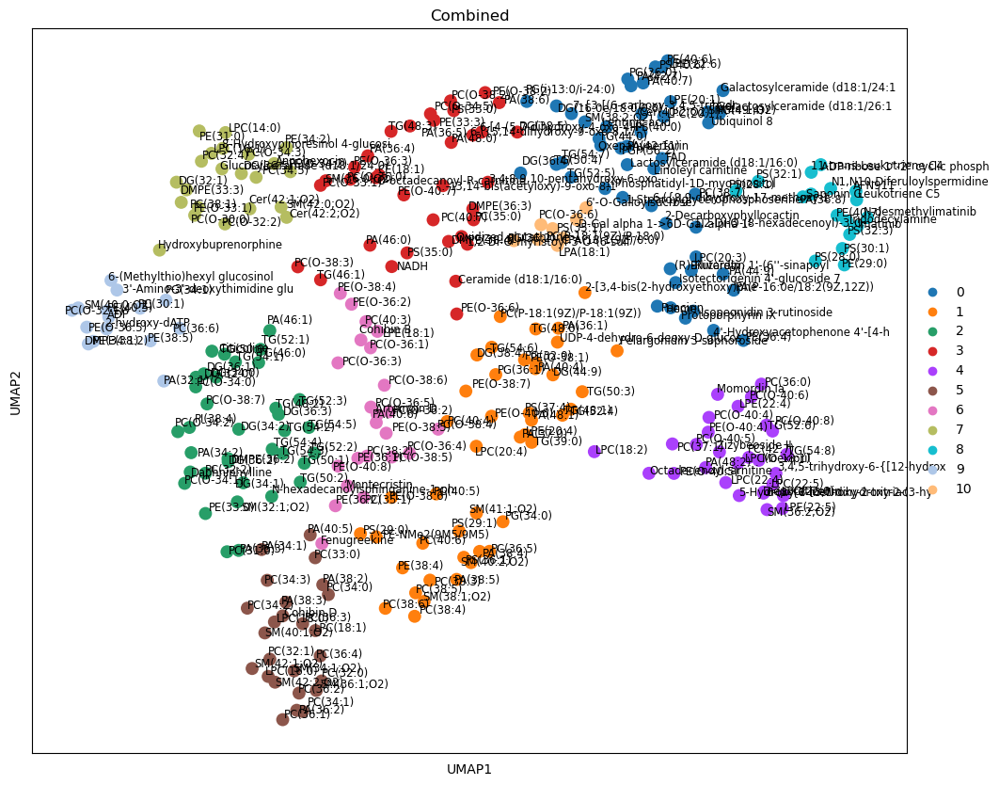

In [74]:
combined_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_combined_modules.pickle'), "rb" ))

test = load_enrichment('enrichment_result_{}_pos_lip_{}', tissue='combined', ontologies=['LION', 'METABOclass', 'METABOsubclass'])
sig_threshold = 0.1
max_elem = max([tab[tab['q.value_median'] <= sig_threshold] .shape[0] for tab in test.values()])

ax = sc.pl.umap(combined_adata, color='leiden', show=False)
    
for line in range(0,combined_adata.shape[0]):
    ax.text(combined_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            combined_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            combined_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title('Combined')
plt.show()

#### Cluster 2

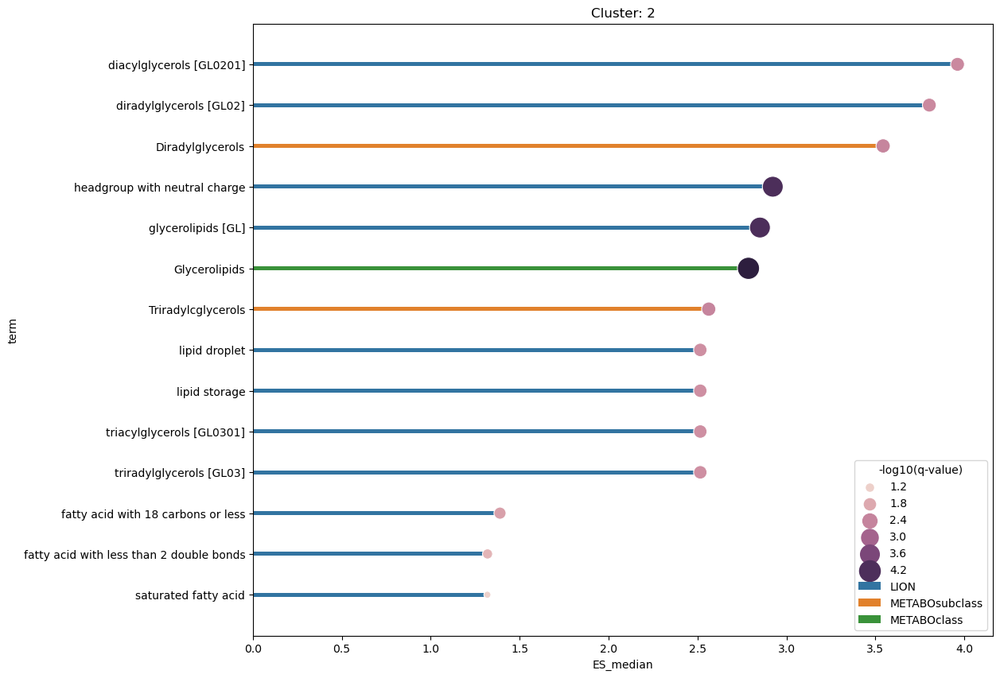

In [47]:
clstr = 2
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Cluster 4

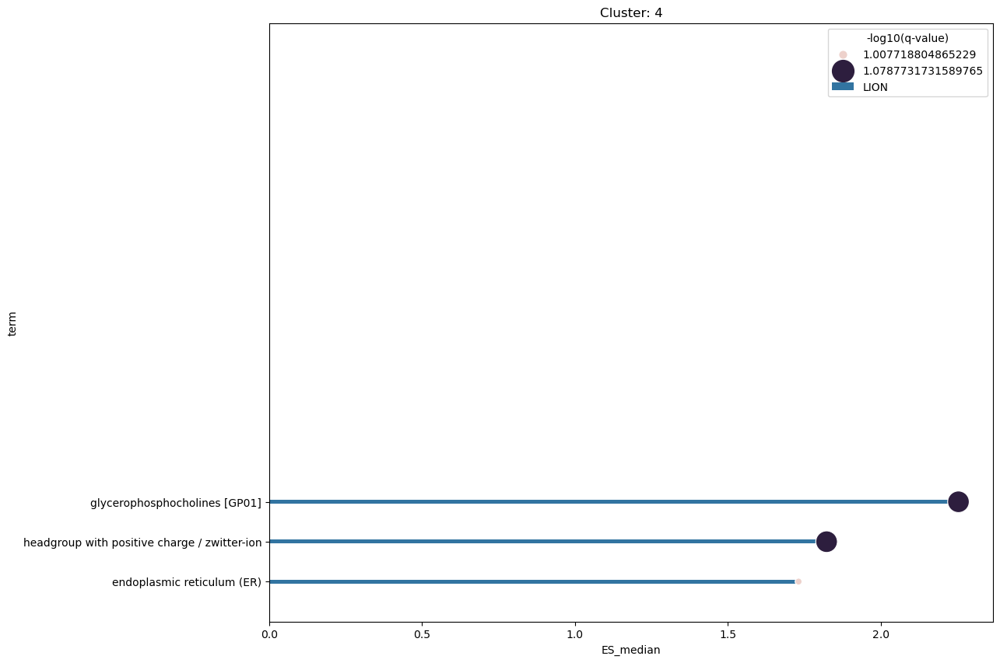

In [48]:
clstr = 4
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Cluster 5

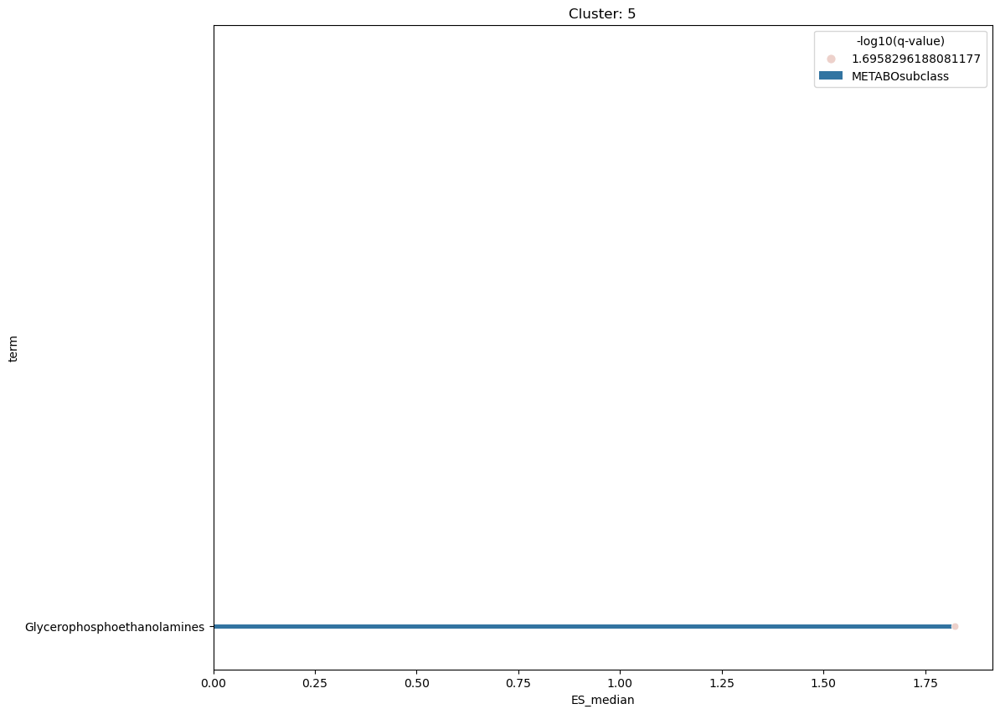

In [49]:
clstr = 5
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Cluster 6

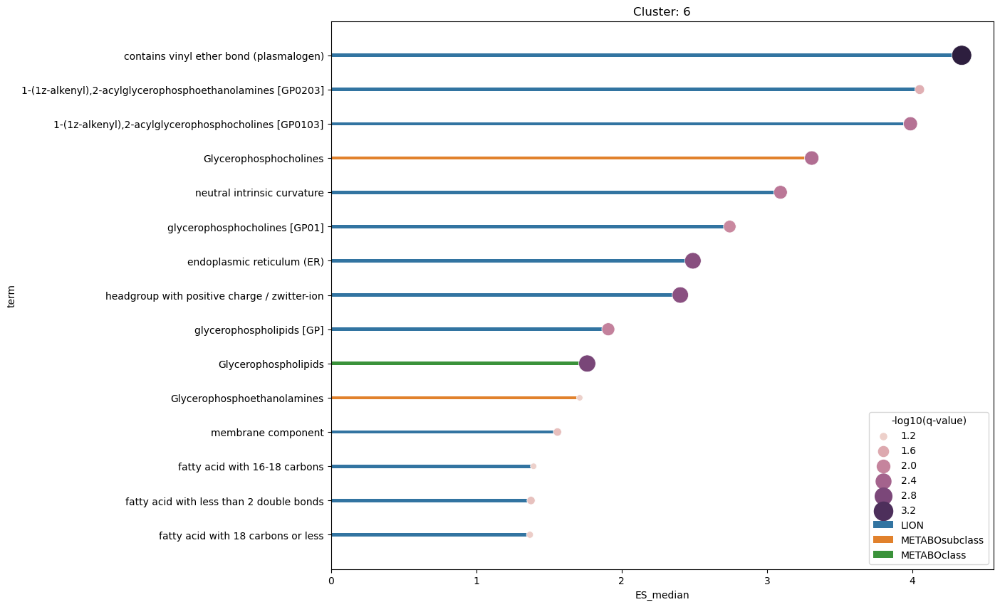

In [53]:
clstr = 6
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Cluster 9

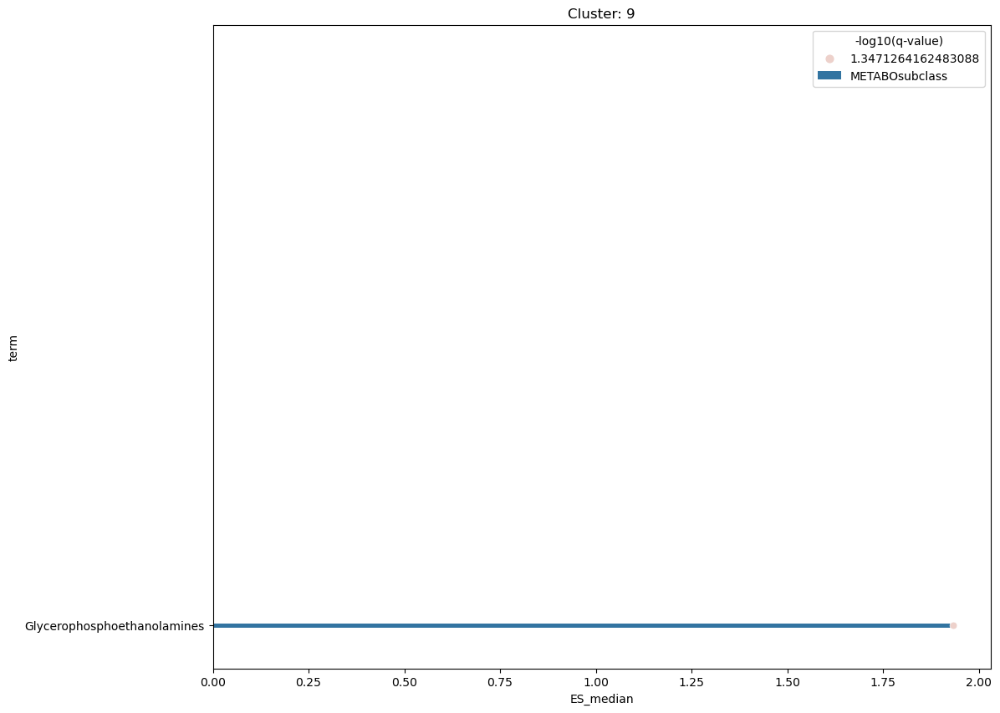

In [51]:
clstr = 9
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

### Tissue modules

#### Brain

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


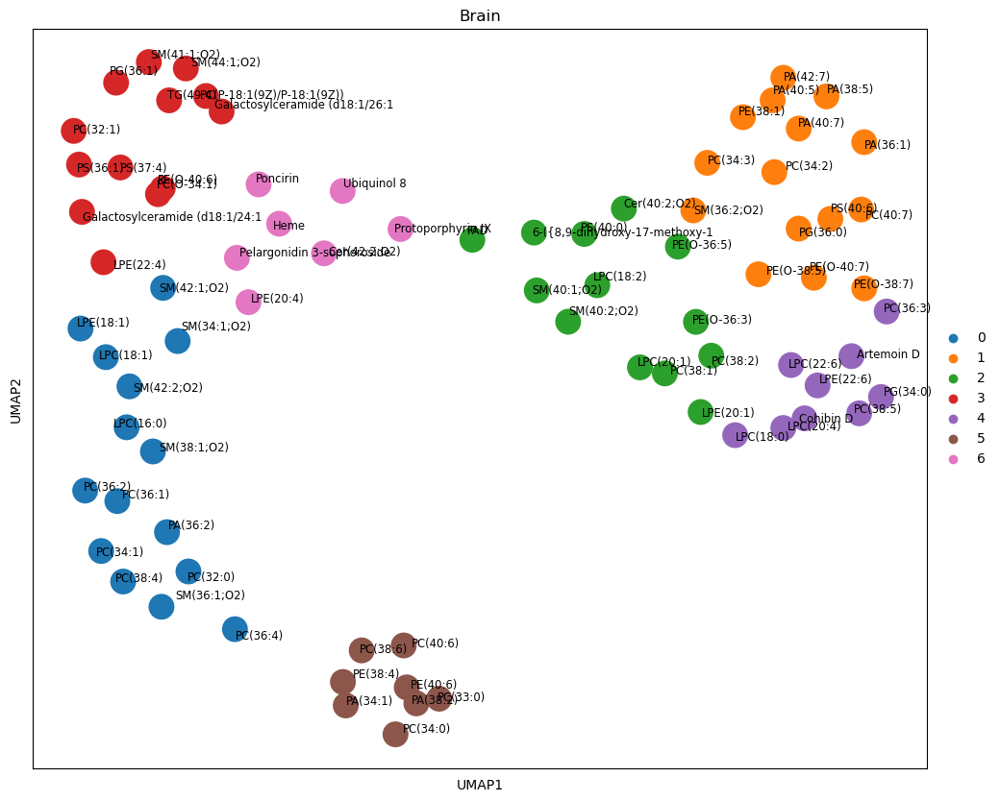

In [78]:
tissue='Brain'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_{tissue}_modules.pickle'), "rb" ))

test = load_enrichment('enrichment_result_{}_pos_lip_{}', tissue=tissue, ontologies=['LION', 'METABOclass', 'METABOsubclass'])
sig_threshold = 0.1
max_elem = max([tab[tab['q.value_median'] <= sig_threshold] .shape[0] for tab in test.values()])
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

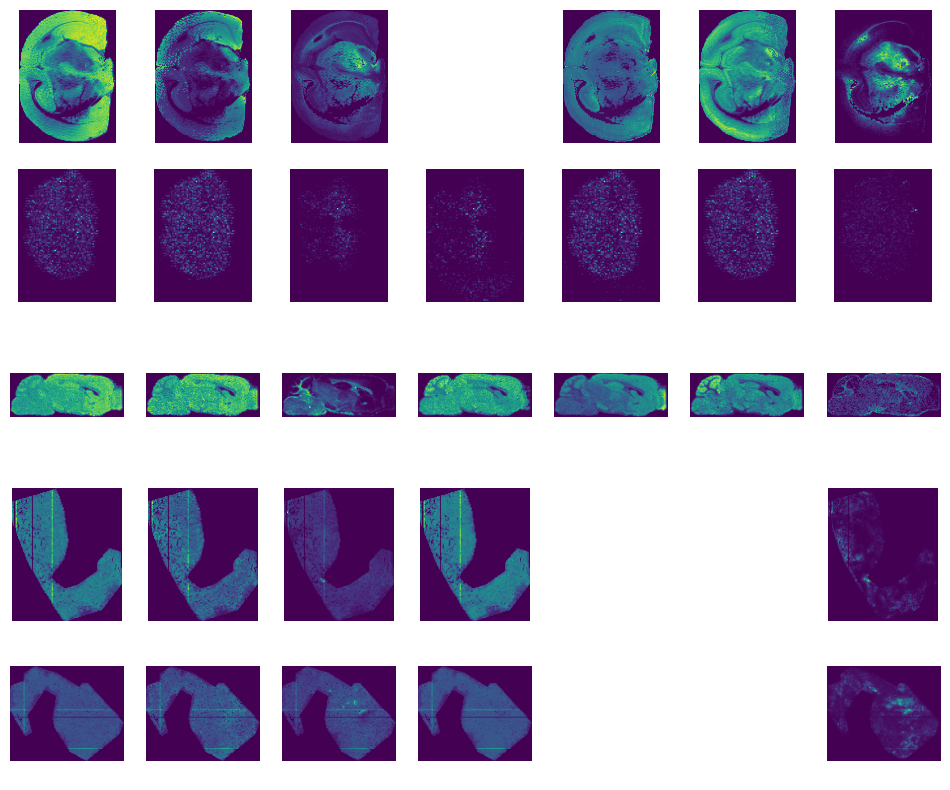

In [93]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

##### Cluster 0

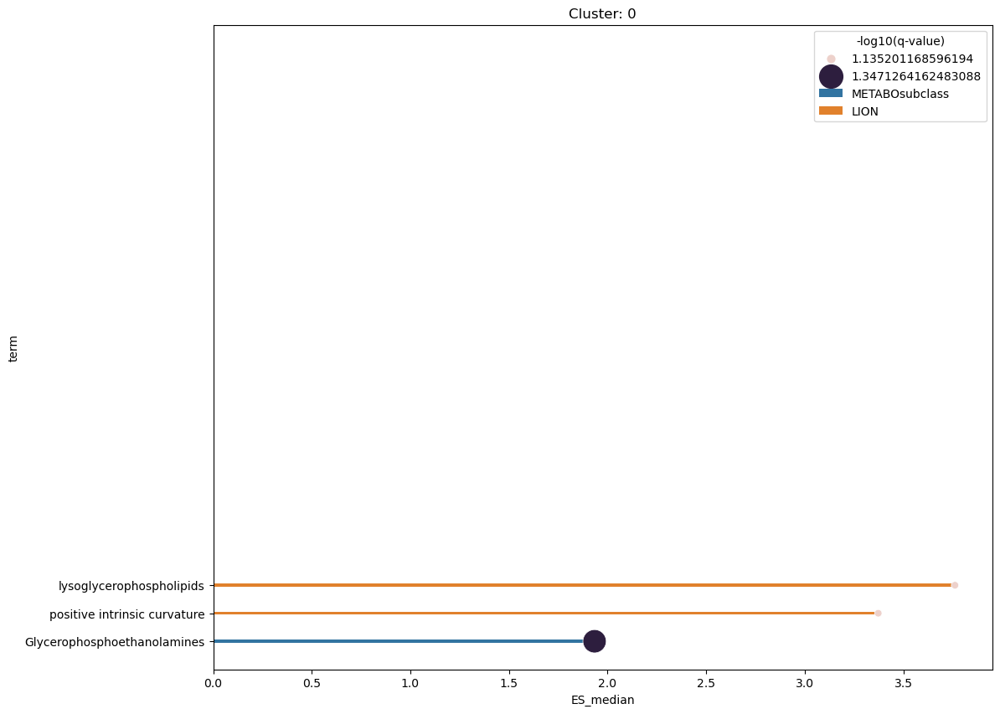

In [91]:
clstr = 0
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

##### Cluster 1

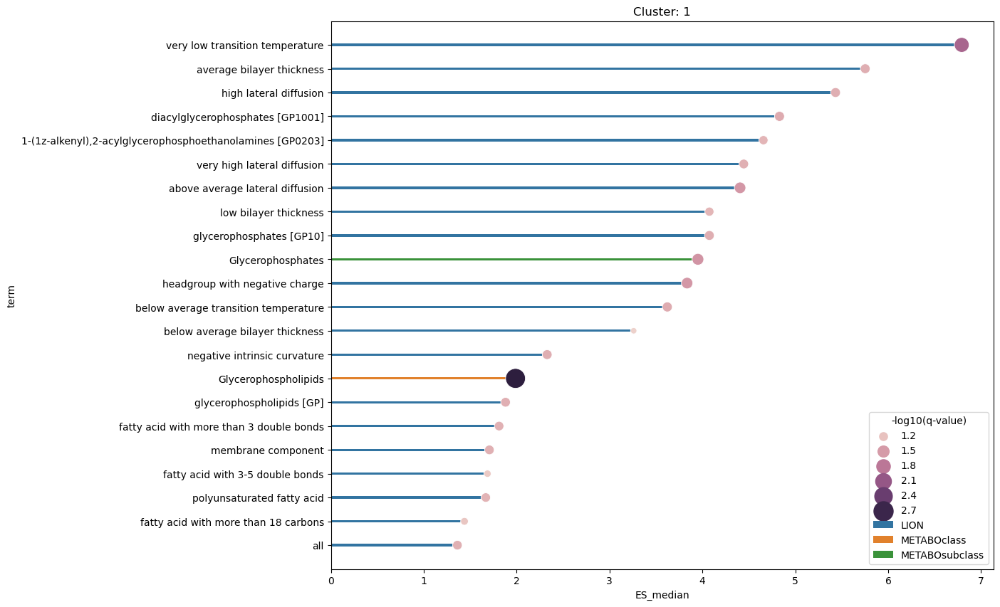

In [82]:
clstr = 1
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

##### Cluster 4

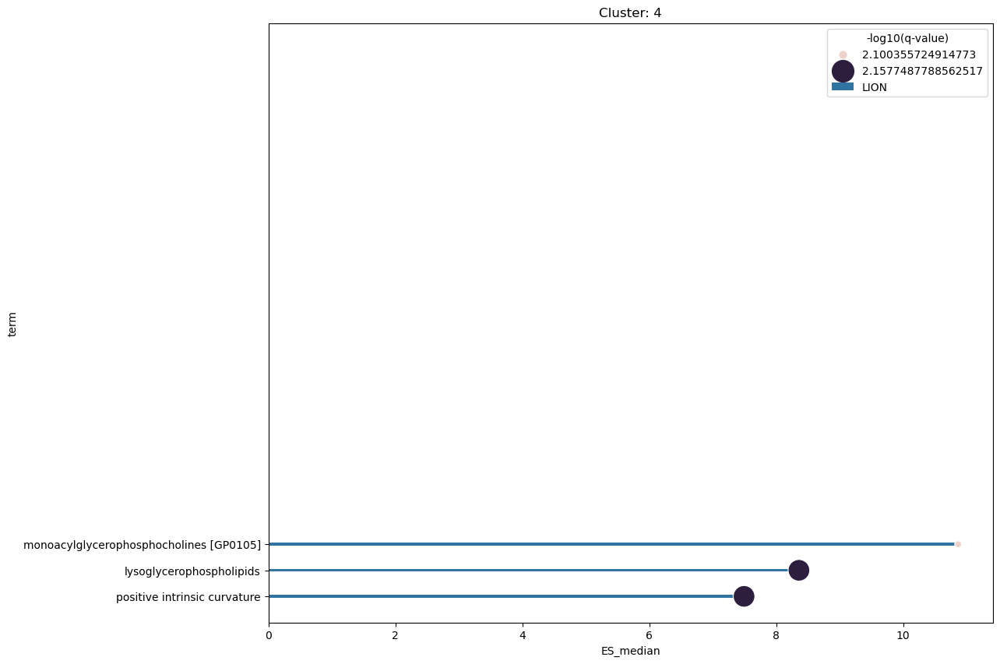

In [85]:
clstr = 4
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

##### Cluster 5

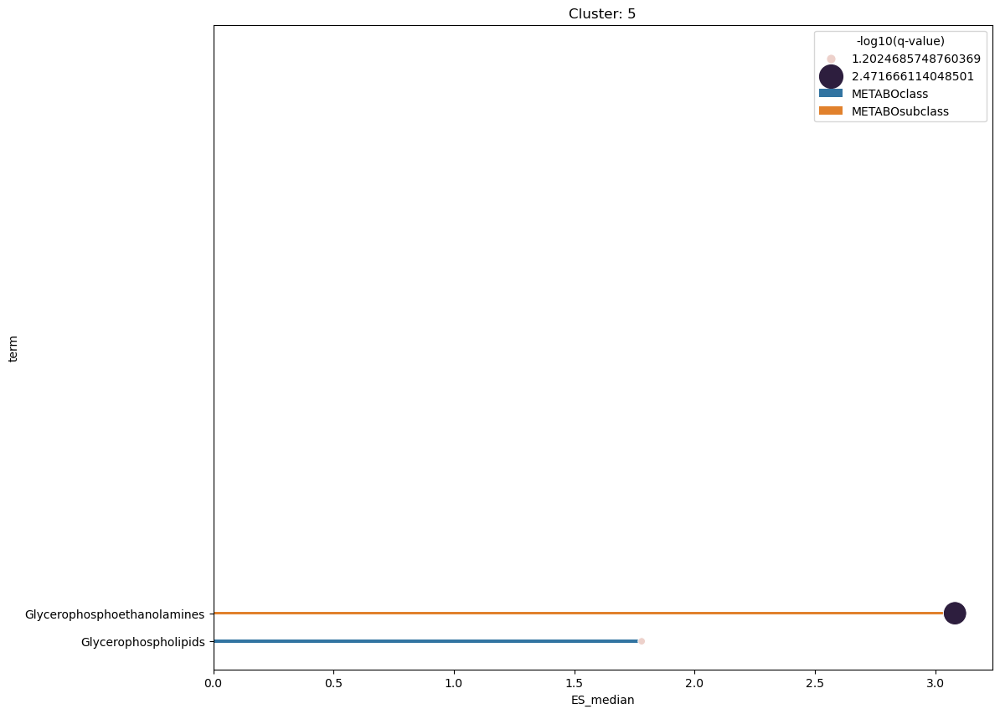

In [86]:
clstr = 5
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Kidney

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


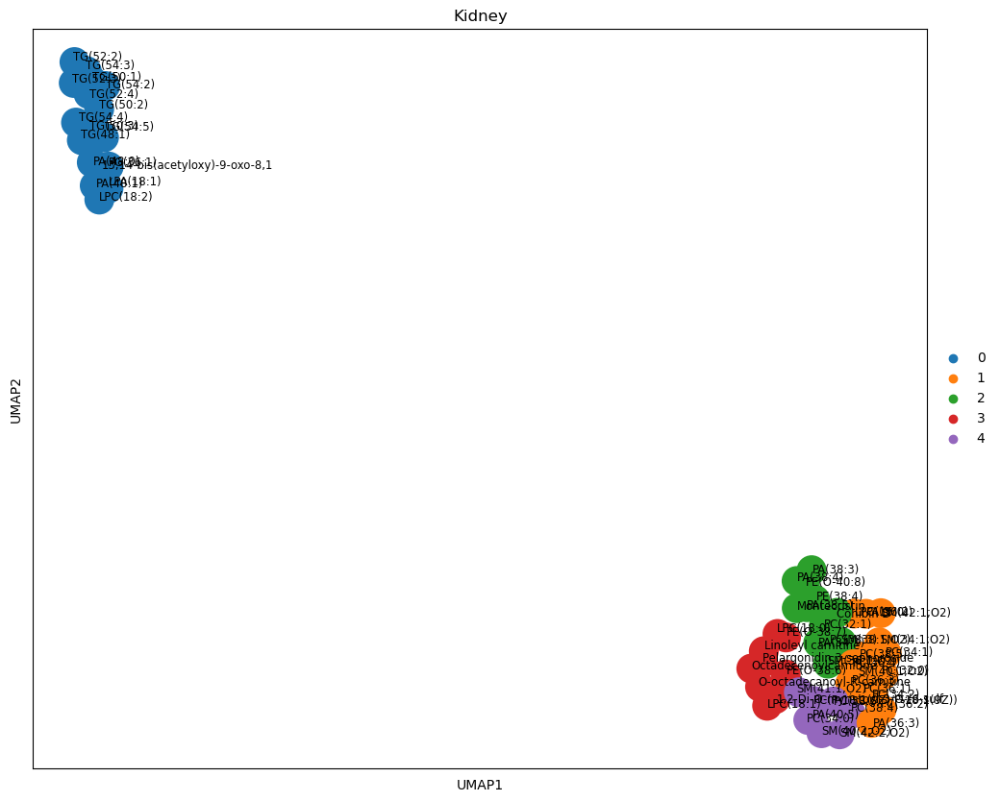

In [102]:
tissue='Kidney'
enr_file = f'enrichment_result_pos_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
    # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
    tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
                                                                                        file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

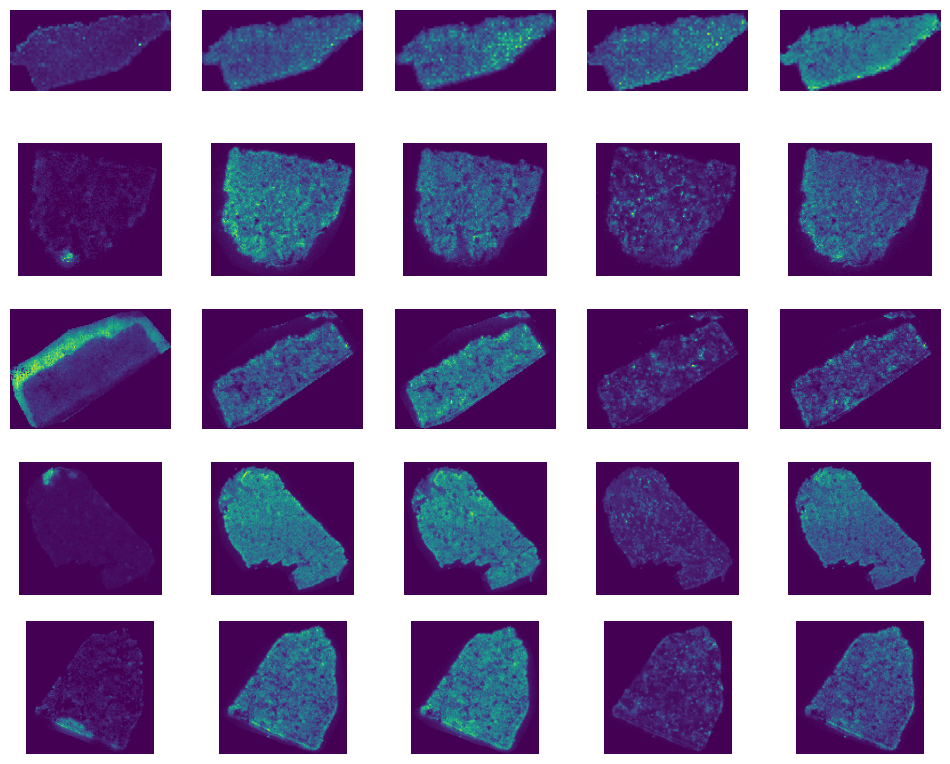

In [106]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

In [ ]:
tissue_enrichment['0']

#### Other

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


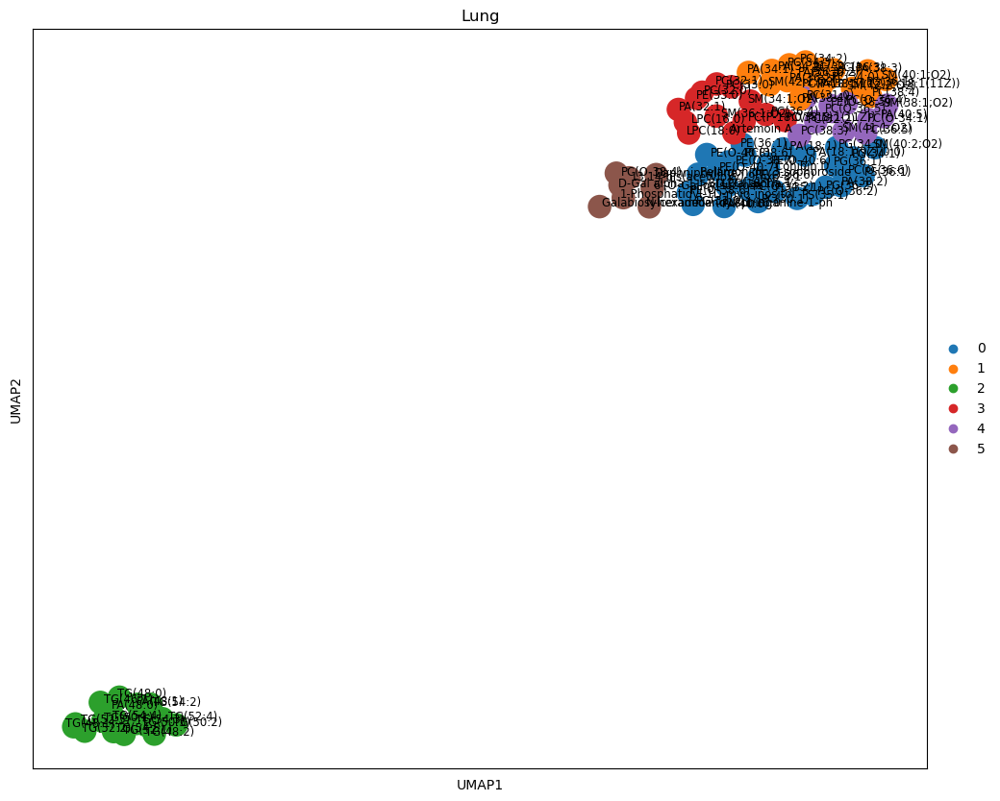

In [135]:
tissue='Lung'
enr_file = f'enrichment_result_pos_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
    # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
    tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
                                                                                        file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

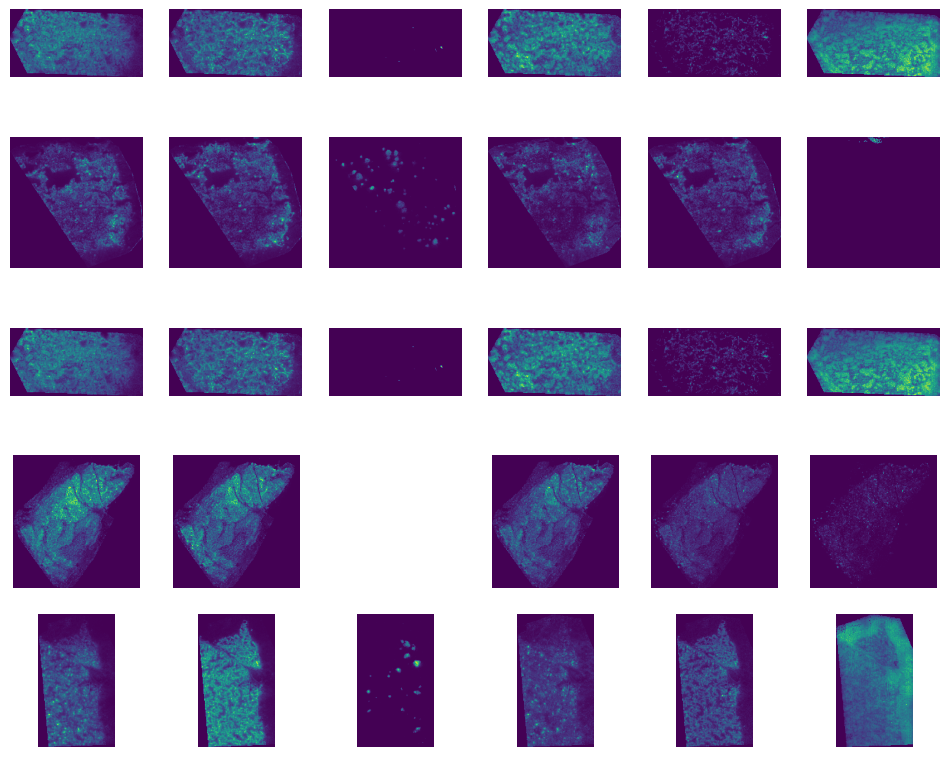

In [138]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

In [54]:
tissue_enrichment['2']

,n,ES_median,ES_sd,p.value_median,p.value_sd,q.value_median,q.value_sd,fraction.bootstrap.presence,name
term,,,,,,,,,
LION:0002927,7,5.717501,1.056616,0.000100,0.004610,0.000701,0.015135,1.00,C20:2
LION:0002970,7,3.804660,0.699333,0.001246,0.017217,0.004050,0.022395,1.00,fatty acid with 2 double bonds
LION:0002967,10,1.938862,0.000000,0.013729,0.000000,0.027459,0.008451,1.00,polyunsaturated fatty acid
LION:0002959,10,1.727082,0.063959,0.031627,0.008179,0.047440,0.012030,1.00,fatty acid with 20 carbons
LION:0002953,7,1.985358,0.304766,0.044903,0.047699,0.053883,0.049703,0.98,fatty acid with 14 carbons
LION:0000259,6,1.967897,0.342864,0.068294,0.060719,0.081953,0.057299,0.94,C14:0
LION:0002971,6,1.881292,0.000000,0.081998,0.000000,0.093712,0.014237,0.82,fatty acid with 3 double bonds
LION:0002969,5,1.861943,0.185168,0.117150,0.038426,0.117150,0.044560,0.84,monounsaturated fatty acid
LION:0002955,6,1.744404,0.175045,0.110331,0.035267,0.119199,0.038651,0.94,fatty acid with 16 carbons


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


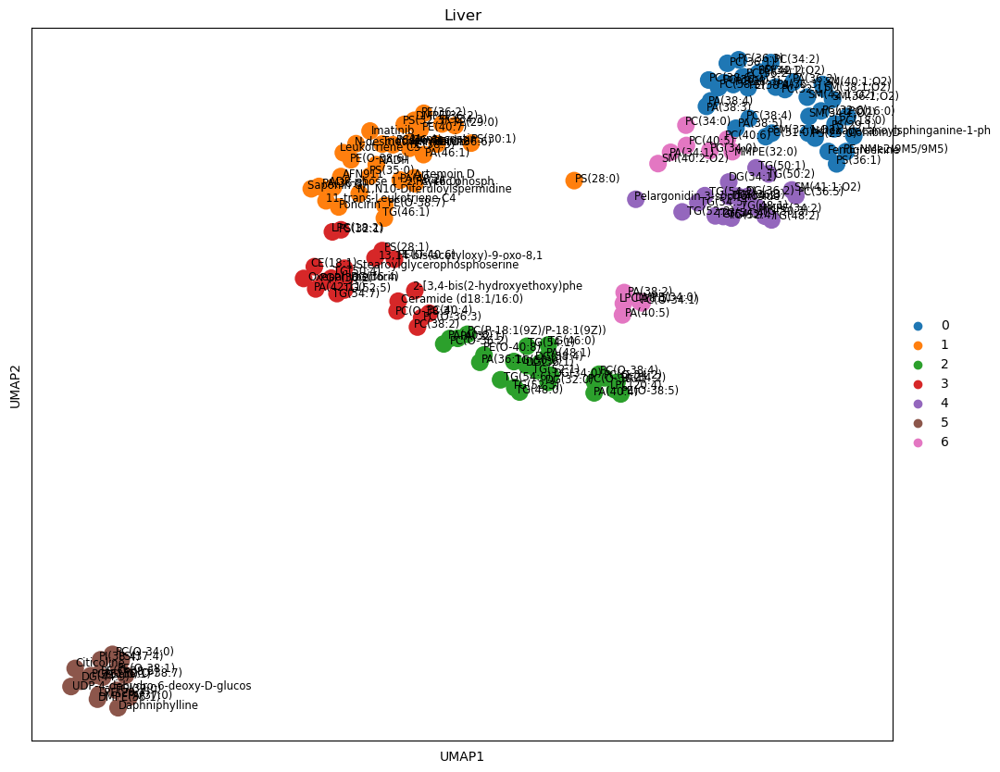

In [139]:
tissue='Liver'
enr_file = f'enrichment_result_pos_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
    # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
    tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
                                                                                        file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

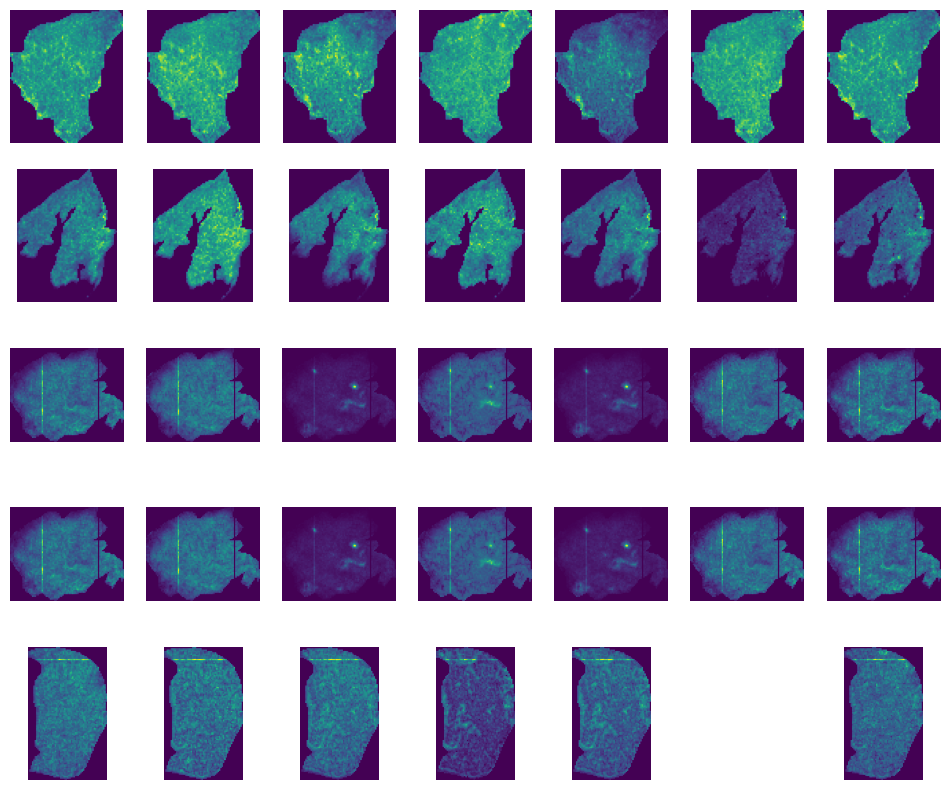

In [144]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

In [61]:
tissue_enrichment['5']

,n,ES_median,ES_sd,p.value_median,p.value_sd,q.value_median,q.value_sd,fraction.bootstrap.presence,name
term,,,,,,,,,
LION:0000003,8,9.155738,0.000000,6.556078e-07,0.000000,0.000007,3.340332e-07,1.00,glycerophospholipids [GP]
LION:0012010,9,5.447796,0.000000,7.530123e-06,0.000000,0.000035,1.642963e-06,1.00,membrane component
LION:0012080,6,10.864193,0.000000,9.673945e-06,0.000000,0.000035,1.642963e-06,1.00,endoplasmic reticulum (ER)
LION:0000095,5,9.079660,0.000000,1.497918e-04,0.000000,0.000330,1.526383e-05,1.00,headgroup with positive charge / zwitter-ion
LION:0012081,4,14.611919,0.000000,1.282408e-04,0.000000,0.000330,1.526383e-05,1.00,mitochondrion
LION:0000011,3,12.650587,0.000000,1.550927e-03,0.000000,0.002843,1.317000e-04,1.00,glycerophosphoethanolamines [GP02]
LION:0001734,3,9.424687,0.000000,3.587815e-03,0.000000,0.005638,2.564144e-04,0.86,contains vinyl ether bond (plasmalogen)
LION:0000093,3,8.849472,0.000000,4.283378e-03,0.000000,0.005890,3.799732e-04,1.00,headgroup with negative charge
LION:0000464,4,3.213875,0.000000,3.109738e-02,0.000000,0.038008,2.151919e-03,1.00,negative intrinsic curvature


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


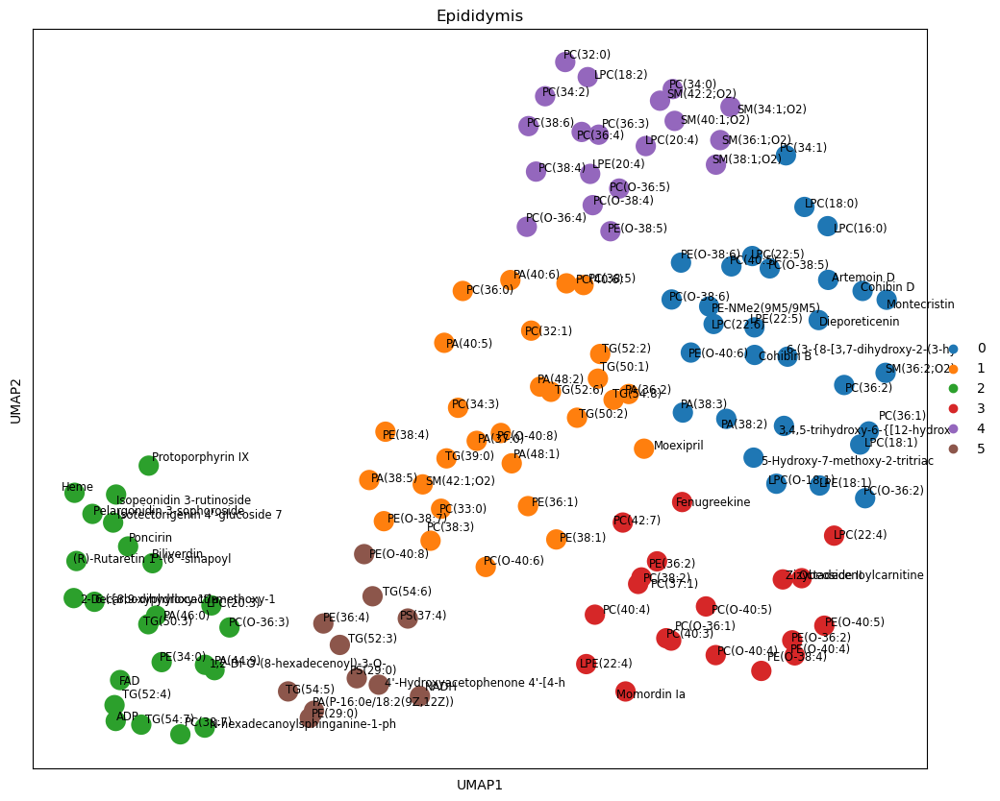

In [145]:
tissue='Epididymis'
enr_file = f'enrichment_result_pos_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
    # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
    tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
                                                                                        file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

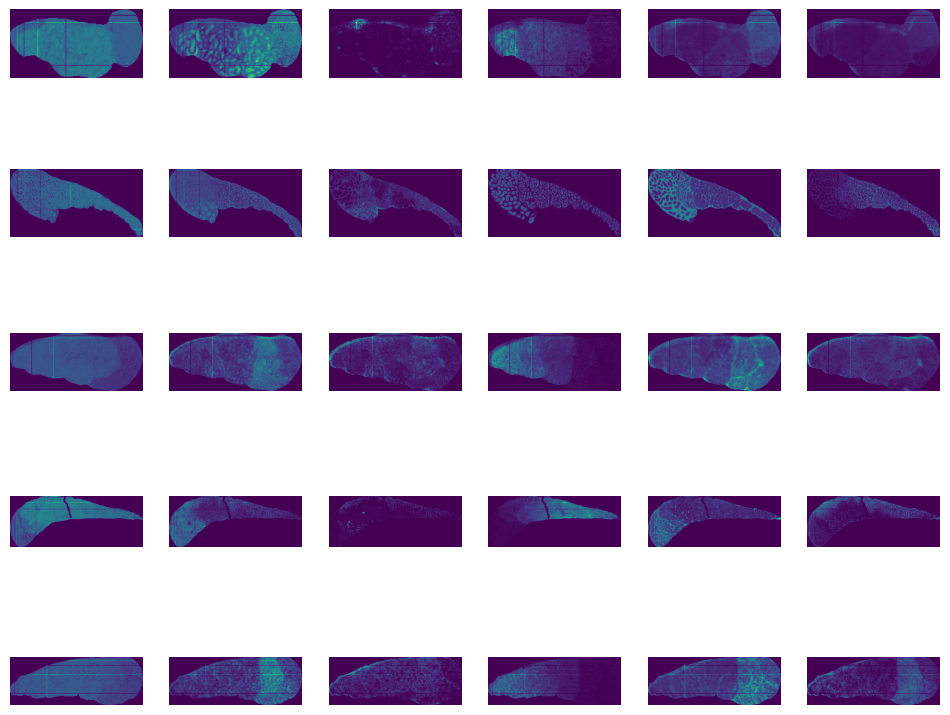

In [146]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

In [74]:
tissue_enrichment['5']

,n,ES_median,ES_sd,p.value_median,p.value_sd,q.value_median,q.value_sd,fraction.bootstrap.presence,name
term,,,,,,,,,
LION:0002969,4,2.302038,0.291421,0.081238,0.031202,0.082013,0.041271,0.60,monounsaturated fatty acid
LION:0002970,3,2.519970,0.403518,0.107768,0.040173,0.107768,0.043062,0.54,fatty acid with 2 double bonds
LION:0002967,6,1.797854,0.000000,0.082013,0.000000,0.135768,0.026770,1.00,polyunsaturated fatty acid
LION:0002976,5,1.730888,0.000000,0.135768,0.000000,0.135768,0.015118,0.98,fatty acid with more than 3 double bonds
LION:0002957,5,1.635485,0.108631,0.164274,0.036056,0.164274,0.007258,0.96,fatty acid with 18 carbons
LION:0002971,4,1.938301,0.000000,0.134672,0.000000,0.164274,0.015409,0.66,fatty acid with 3 double bonds
LION:0002955,4,1.797265,0.142086,0.166222,0.035931,0.166222,0.020146,0.70,fatty acid with 16 carbons


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


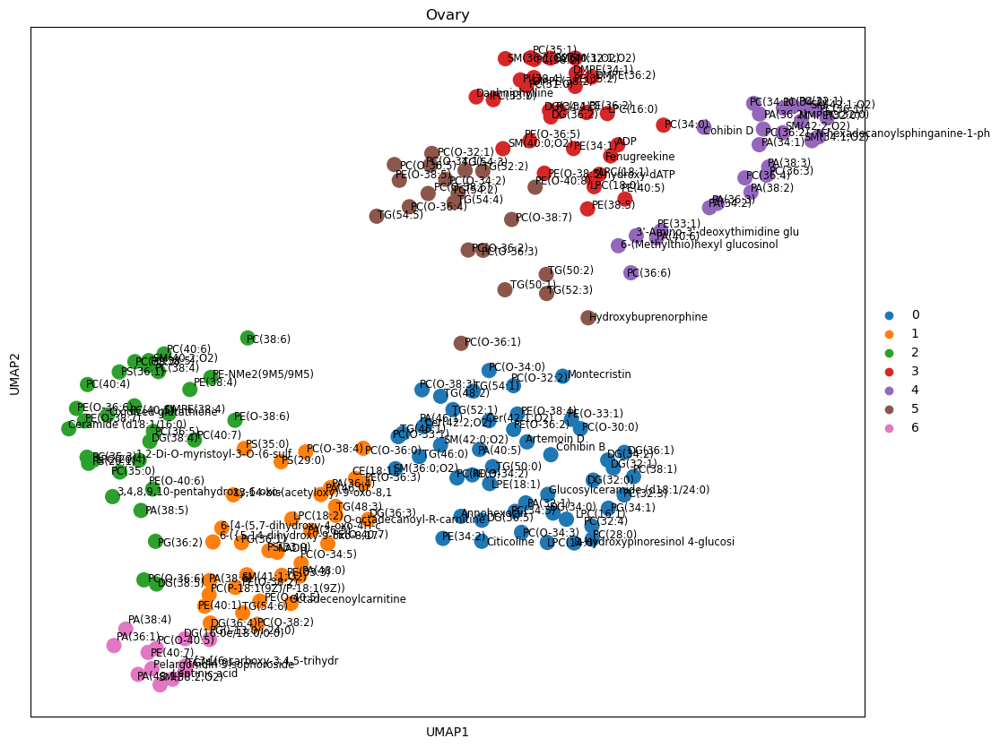

In [147]:
tissue='Ovary'
enr_file = f'enrichment_result_pos_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
    # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
    tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
                                                                                        file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

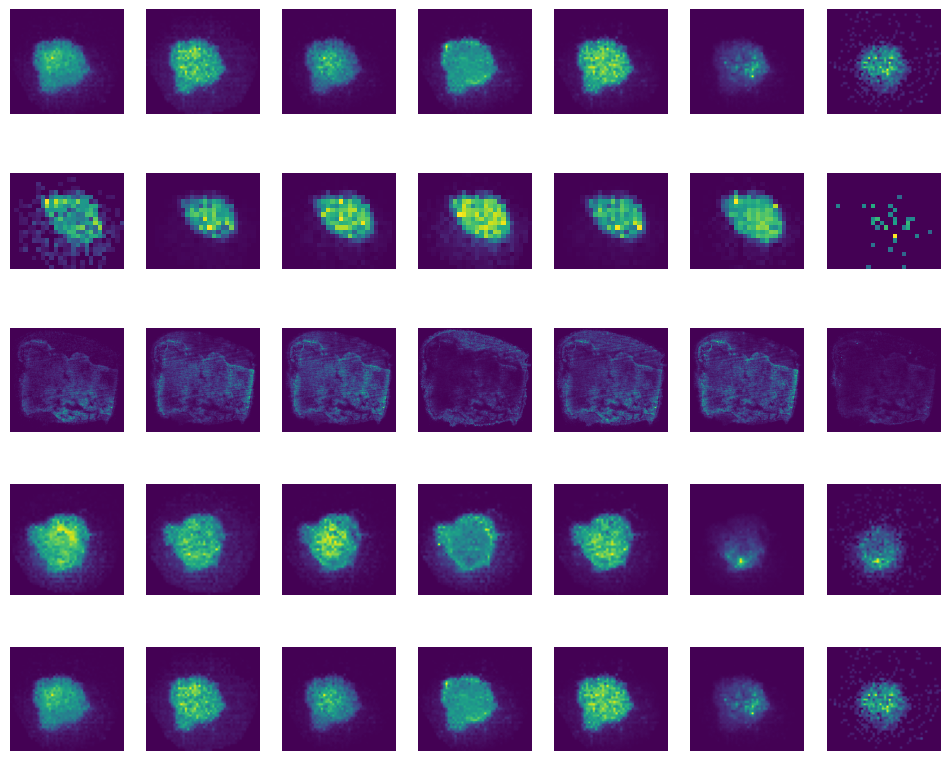

In [148]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

In [76]:
tissue_enrichment['5']

,n,ES_median,ES_sd,p.value_median,p.value_sd,q.value_median,q.value_sd,fraction.bootstrap.presence,name
term,,,,,,,,,
LION:0000010,11.0,28.159664,0.840337,2.061964e-14,3.713078e-13,2.078675e-13,1.809057e-12,1.00,glycerophosphocholines [GP01]
LION:0000465,11.0,28.009878,0.835868,2.188079e-14,3.917305e-13,2.078675e-13,1.809057e-12,1.00,neutral intrinsic curvature
LION:0000095,12.0,16.602808,0.000000,5.091415e-13,0.000000e+00,2.371185e-12,9.584940e-13,1.00,headgroup with positive charge / zwitter-ion
LION:0012080,12.0,16.554961,0.000000,5.269299e-13,0.000000e+00,2.371185e-12,9.584940e-13,1.00,endoplasmic reticulum (ER)
LION:0001734,10.0,23.935714,3.427926,2.262339e-12,4.811208e-07,9.049357e-12,1.272004e-06,1.00,contains vinyl ether bond (plasmalogen)
LION:0000032,8.0,33.891277,6.105639,3.574745e-11,5.723376e-07,1.173708e-10,1.323871e-06,1.00,"1-(1z-alkenyl),2-acylglycerophosphocholines [G..."
LION:0000003,12.0,10.463700,0.000000,1.169861e-10,0.000000e+00,3.342461e-10,5.576408e-11,1.00,glycerophospholipids [GP]
LION:0012010,12.0,5.534269,0.000000,1.674403e-07,0.000000e+00,3.976707e-07,3.973018e-08,1.00,membrane component
LION:0002922,8.0,5.154393,1.198395,7.330098e-05,5.598325e-03,1.710356e-04,8.578374e-03,1.00,C18:1


### Pairplots

To investigate the correlation of colocs between datasets.

The idea would be to check if they are certain clusters of lipids which are highly colocalizaed in one tissue and less colocalized in the other tissue. (The basis for this could also be the Lipid class connection plots).

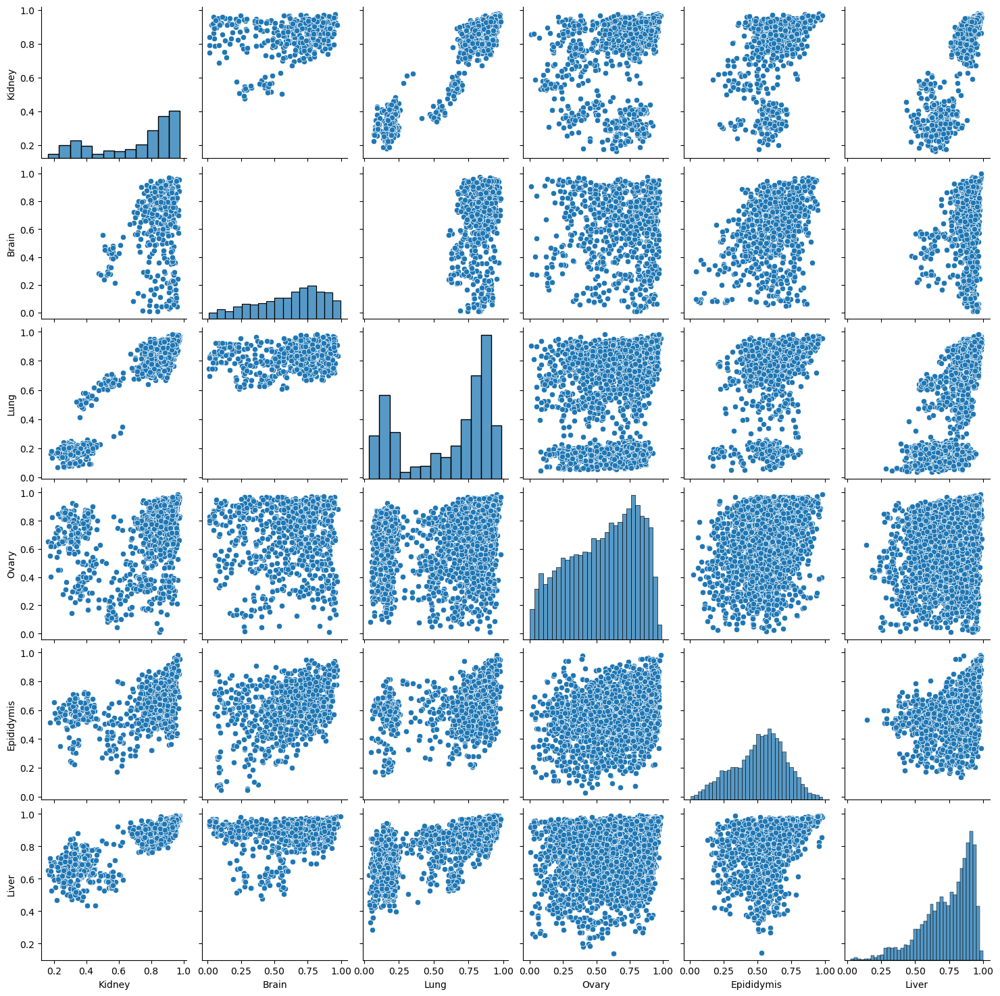

In [88]:
out_dict = {}
for tis in tissue_colocs.keys():
    tmp = df[df['tissue']==tis]['mean']
    curr_series = pd.Series(np.nan, index=list(set(df.index)))
    for key, val in tmp.items():
        curr_series[key]=val
    out_dict[tis] = curr_series
pairdf = pd.DataFrame(out_dict)
    
sns.pairplot(pairdf)

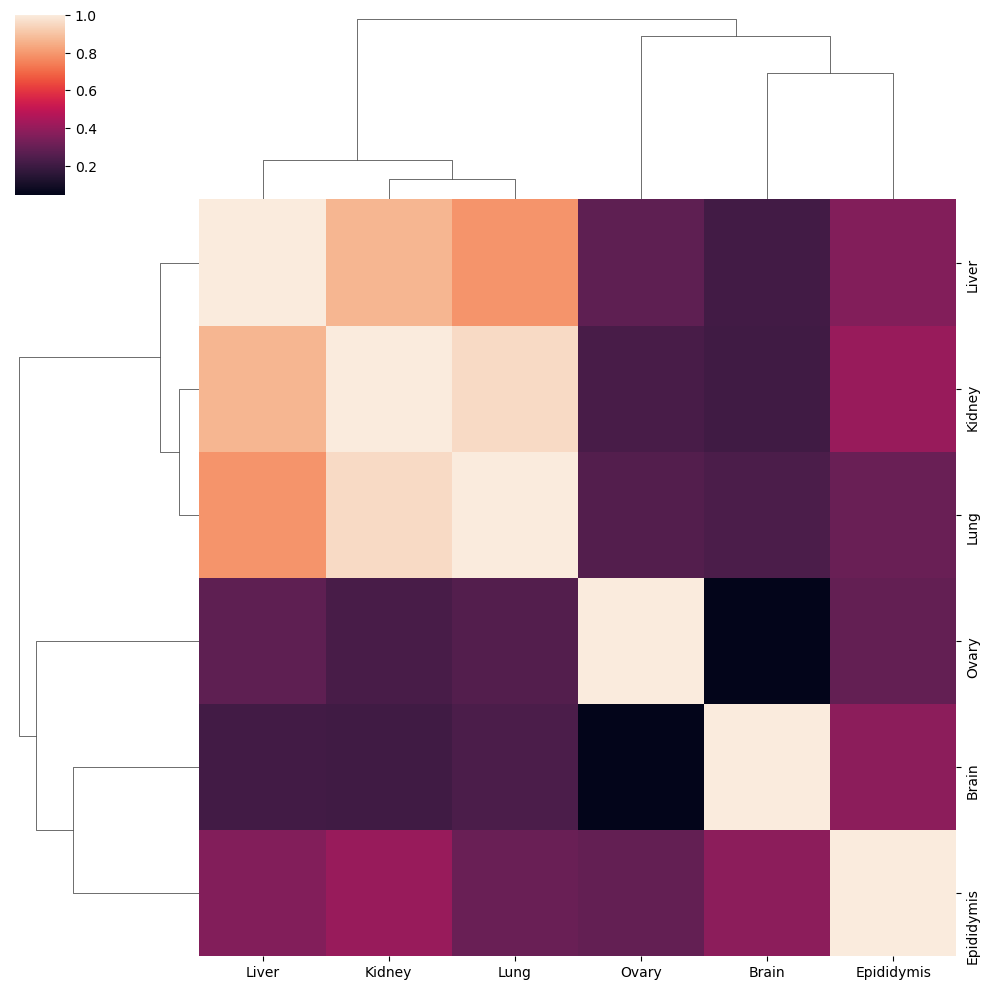

In [90]:
sns.clustermap(pairdf.corr())

In [91]:
df

,mean,variance,cv,coocurrence,ion_pairs,median,iqr,mediqr,pval_mean,pval_mean_corr,pval_mediqr,pval_mediqr_corr,tissue,mean_sig,mediqr_sig
ion_pairs,,,,,,,,,,,,,,,
"(C24H50NO7P, C25H45NO4)",0.706819,0.008700,0.131963,0.346154,"(C24H50NO7P, C25H45NO4)",0.740430,0.096563,7.667810,0.035310,43.466971,0.000062,0.076933,Kidney,False,False
"(C24H50NO7P, C37H66O4)",0.733673,0.048443,0.299993,0.453846,"(C24H50NO7P, C37H66O4)",0.827780,0.250357,3.306395,0.003799,4.676865,0.000200,0.246151,Kidney,False,False
"(C24H50NO7P, C37H68O4)",0.752992,0.044193,0.279182,0.530769,"(C24H50NO7P, C37H68O4)",0.839321,0.263390,3.186612,0.000211,0.259144,0.000684,0.842219,Kidney,False,False
"(C24H50NO7P, C37H70O12S)",0.871723,0.009331,0.110810,0.230769,"(C24H50NO7P, C37H70O12S)",0.895521,0.033955,26.373403,0.000029,0.035170,0.000029,0.035170,Kidney,True,True
"(C24H50NO7P, C37H71O8P)",0.836817,0.008518,0.110289,0.507692,"(C24H50NO7P, C37H71O8P)",0.856269,0.075276,11.374983,0.000091,0.111899,0.000091,0.111899,Kidney,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(C51H99O8P, C57H108O6)",0.943637,0.001498,0.041011,0.222222,"(C51H99O8P, C57H108O6)",0.943637,0.038700,24.383539,0.033699,302.317907,0.239903,2152.165360,Liver,False,False
"(C51H99O8P, C57H98O6)",0.814683,0.008676,0.114332,0.222222,"(C51H99O8P, C57H98O6)",0.814683,0.093144,8.746493,0.394176,3536.149292,0.480769,4312.983166,Liver,False,False
"(C21H27N7O14P2, C48H88NO8P)",0.444676,0.146834,0.861725,0.222222,"(C21H27N7O14P2, C48H88NO8P)",0.444676,0.383189,1.160464,0.907511,8141.280745,0.952974,8549.129734,Liver,False,False


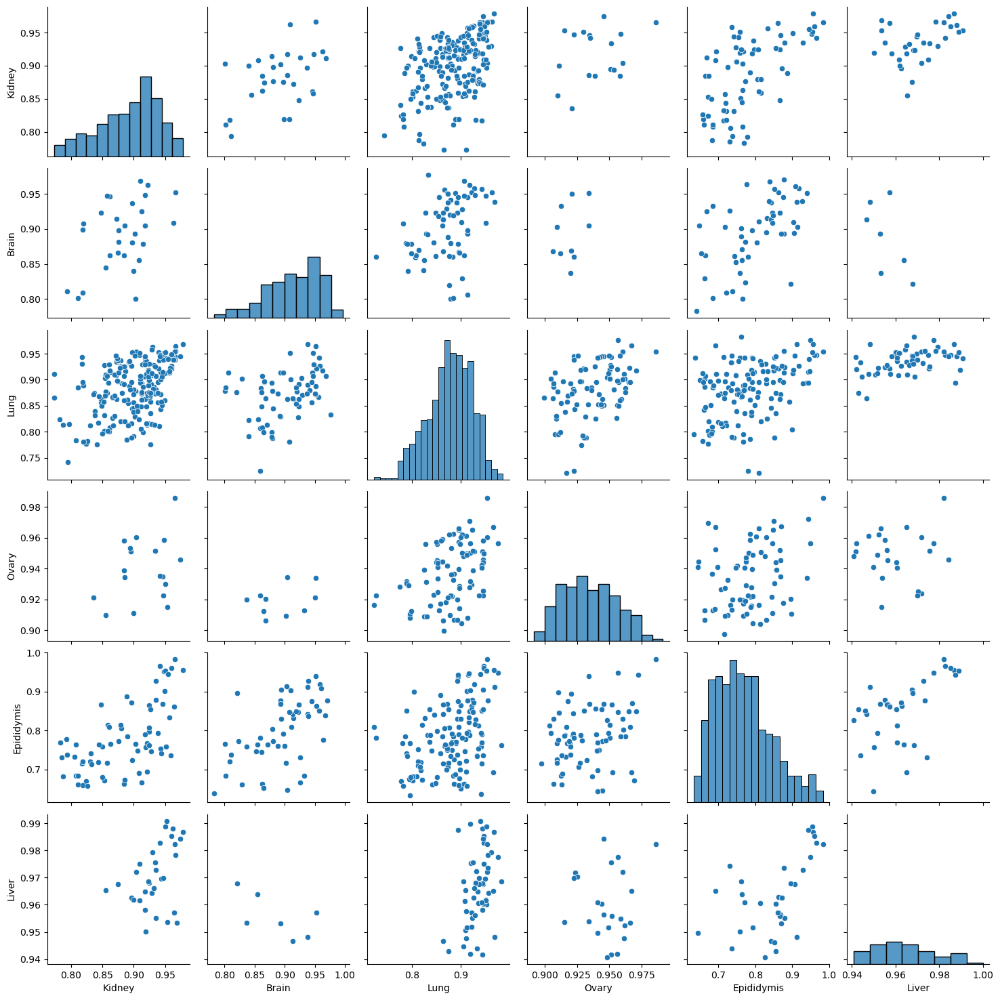

In [93]:
out_dict = {}
for tis in tissue_colocs.keys():
    tmp = df[df['tissue']==tis]
    tmp = tmp[tmp['pval_mean_corr'] <= 0.1]['mean']
    
    curr_series = pd.Series(np.nan, index=list(set(df.index)))
    for key, val in tmp.items():
        curr_series[key]=val
    out_dict[tis] = curr_series
pairdf = pd.DataFrame(out_dict)
    
sns.pairplot(pairdf)

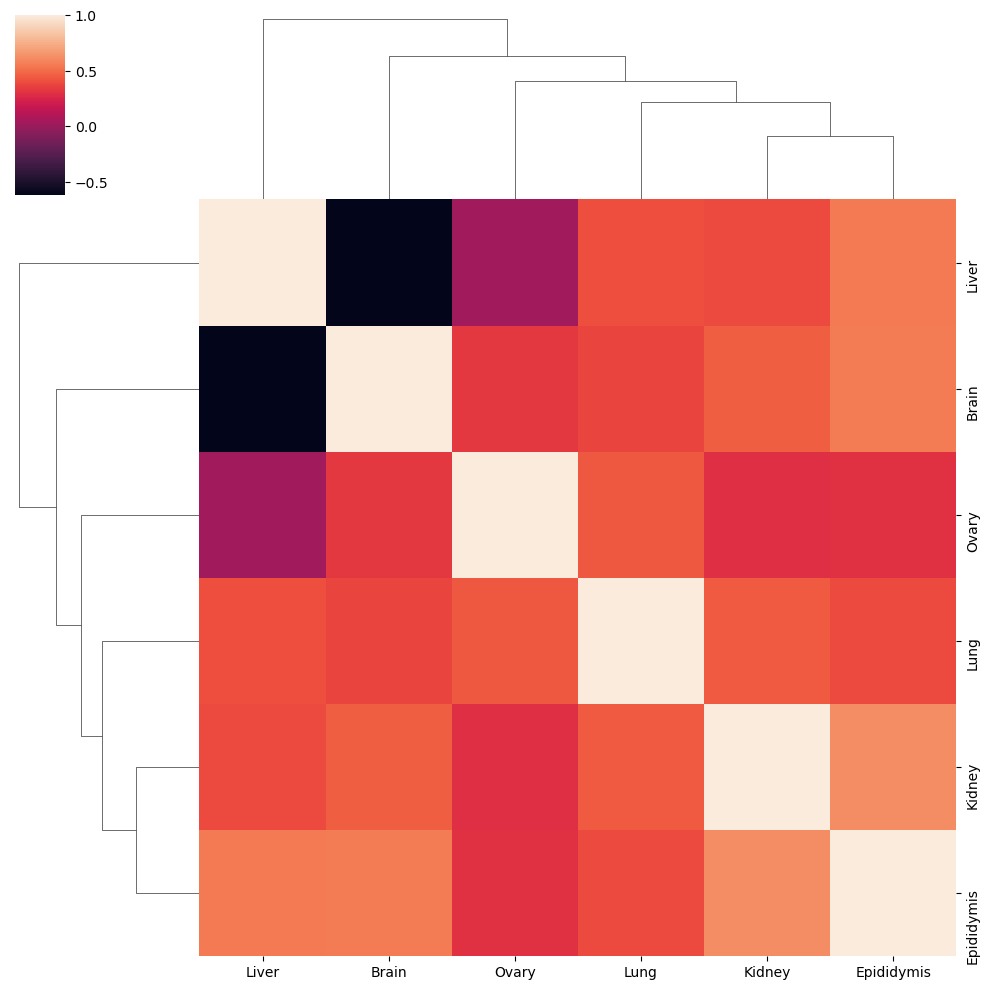

In [94]:
sns.clustermap(pairdf.corr())

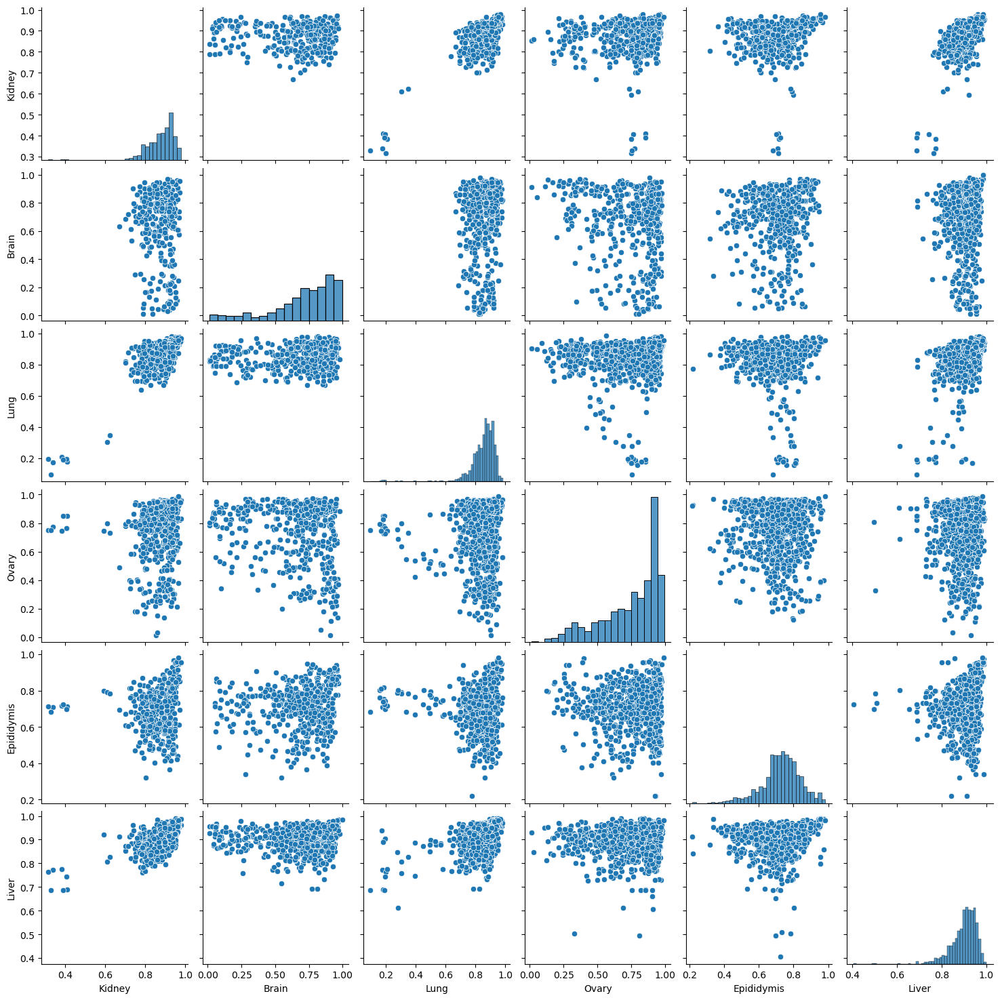

In [97]:
out_dict = {}

sig_corr = df[df['pval_mean_corr'] <= 0.1]

for tis in tissue_colocs.keys():
    tmp = df[df['tissue']==tis]['mean']
    
    curr_series = pd.Series(np.nan, index=list(set(sig_corr.index)))
    for key, val in tmp.items():
        if key in curr_series.index:
            curr_series[key]=val
    out_dict[tis] = curr_series
pairdf = pd.DataFrame(out_dict)
    
sns.pairplot(pairdf)

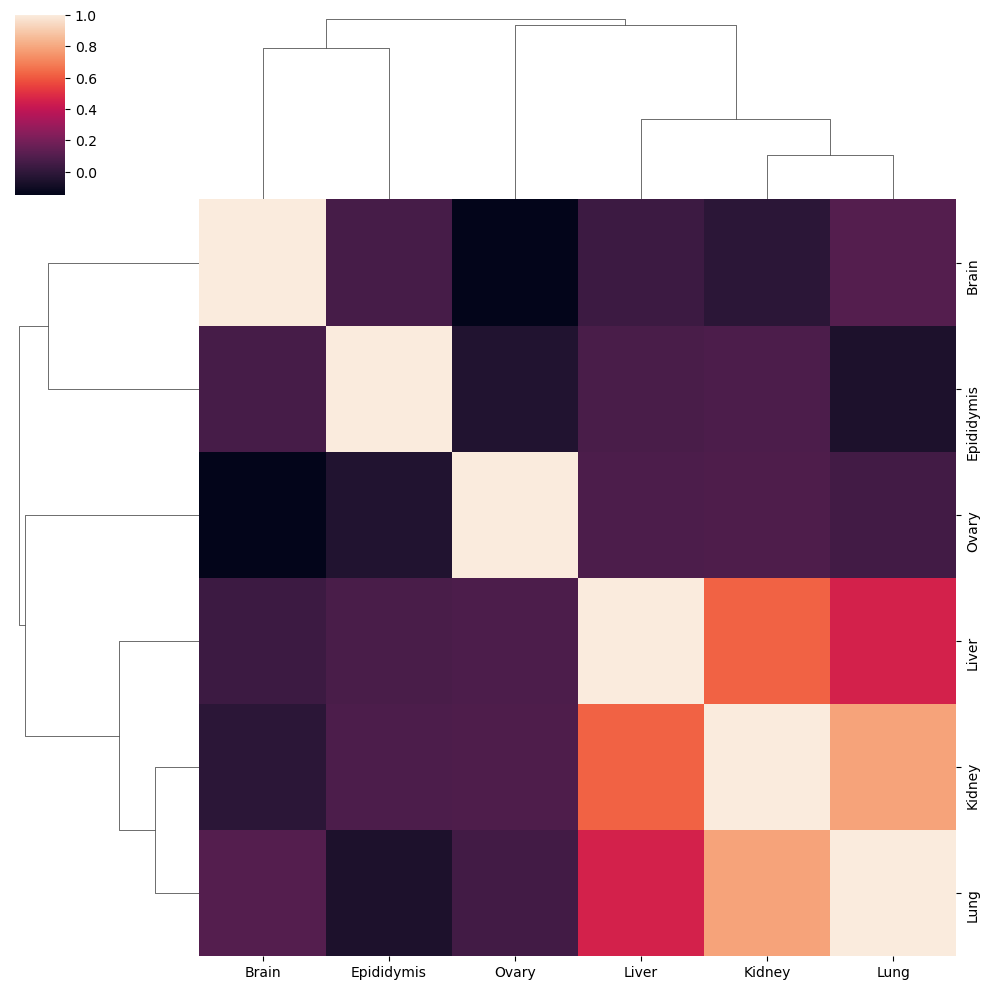

In [98]:
sns.clustermap(pairdf.corr())

### Tissue lipid class colocs

In [14]:
tissue_lx = pickle.load(open(os.path.join(store_dir, 'pos_lip_tissue_lx.pickle'), "rb" ))

In [15]:
ref_lip_dict = lx2m.get_lx2_ref_lip_dict()
class_reacs = lx2m.get_organism_combined_class_reactions(ref_lip_dict=ref_lip_dict, organism='HSA')

In [102]:
max_hops = 1
    
class_list = []
val_list = [] # 
ds_list = [] # 
tissue_list = [] # 
net_edge_list = [] #

# Loop over tissues
for tis in tissue_colocs.keys():
    print(tis)
    # Loop over datasets
    for ds in tissue_colocs[tis]['coloc_dict'].keys():
        
        tmp_colocs = tissue_colocs[tis]['coloc_dict'][ds]
        
        idx = tmp_colocs.index
        
        curr_net = tissue_lx[tis]['nets'][ds]
        
        net_nodes = dict(curr_net.nodes(data=True))
        # Loop over colocs per tissue
        for i in range(len(idx)):
            for j in range(i+1, len(idx)):
                
                if idx[i] in curr_net.nodes and idx[j] in curr_net.nodes:
                    val_list.append(tmp_colocs.loc[idx[i], idx[j]])
                    ds_list.append(ds)
                    tissue_list.append(tis)
                    if catch_sp(curr_net, idx[i], idx[j]) <= max_hops:
                        net_edge_list.append(True)
                    else:
                        net_edge_list.append(False)
                        
                    # Class-class list
                    c1 = lx2.lipid_parser(net_nodes[idx[i]]['sum_species'].index[0], reference_lipids=ref_lip_dict).get_lipid_class()
                    c2 = lx2.lipid_parser(net_nodes[idx[j]]['sum_species'].index[0], reference_lipids=ref_lip_dict).get_lipid_class()

                    #c1 = net_nodes[idx[i]]['sum_species'].index[0].split('(')[0]
                    #c2 = net_nodes[idx[j]]['sum_species'].index[0].split('(')[0]
                    
                    c11, c22 = tuple(sorted([c1, c2]))
                    class_list.append(f'{c11} - {c22}')
                    
                    
cc_df = pd.DataFrame({'cc': class_list, 'coloc': val_list, 'ds': ds_list, 'tissue': tissue_list, 'net_edge': net_edge_list})

Kidney
Brain
Lung
Ovary
Epididymis
Liver


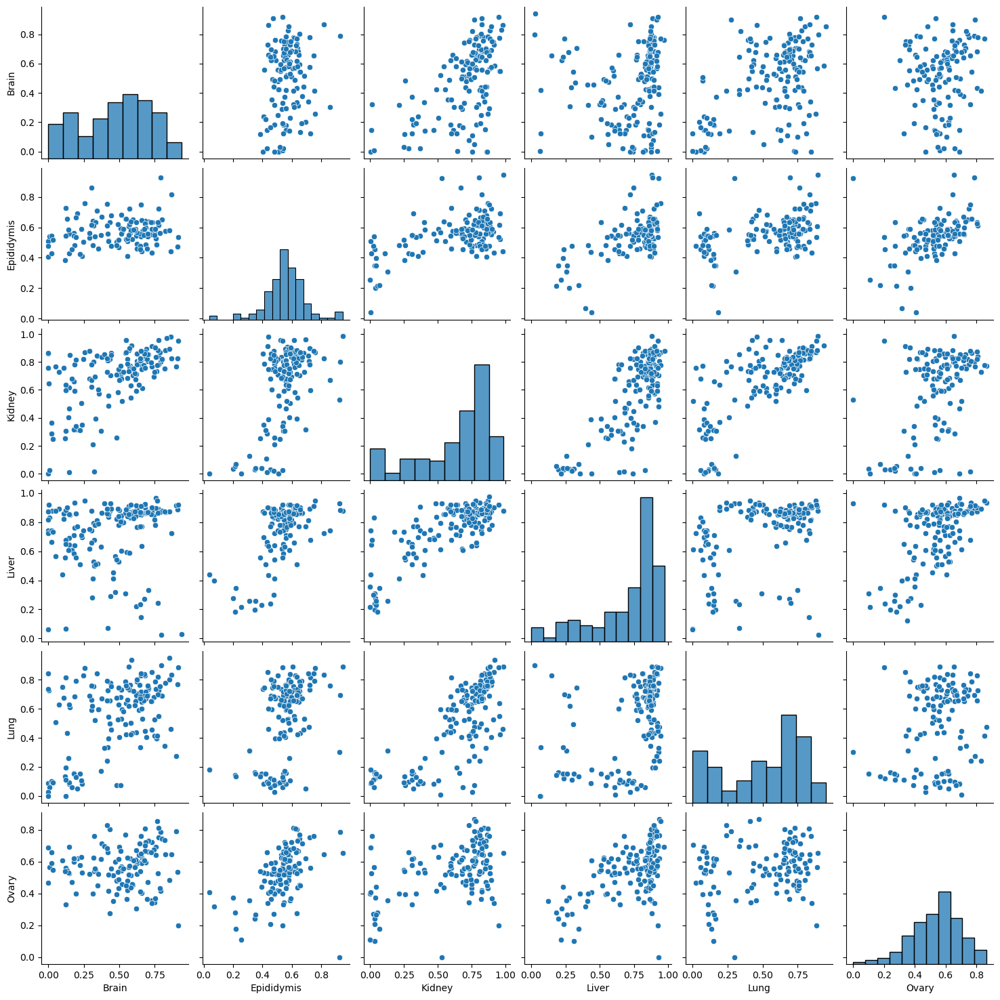

In [146]:
cc_final = cc_df.groupby(['tissue', 'cc']).agg('mean', numeric_only=True).reset_index().drop(columns=['net_edge']).pivot(index='cc',columns='tissue',values='coloc')
sns.pairplot(cc_final)

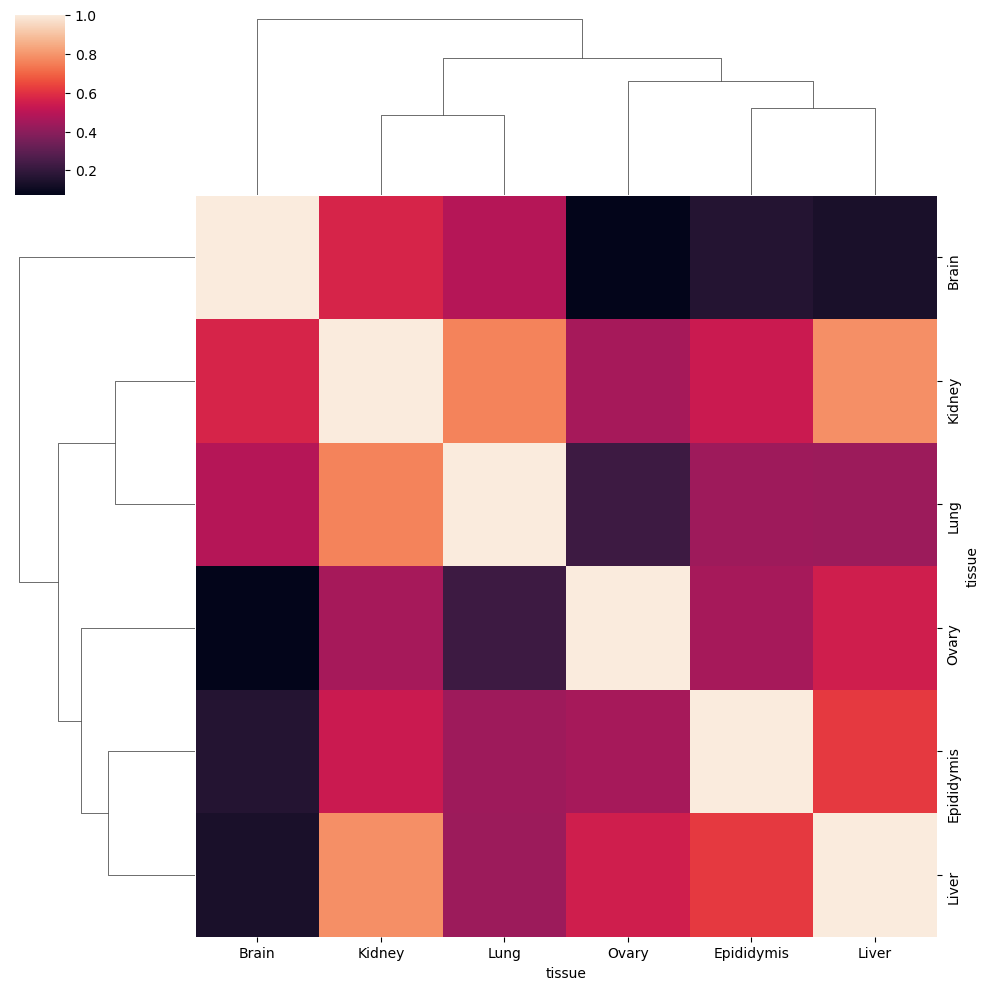

In [147]:
sns.clustermap(cc_final.corr())

Variance

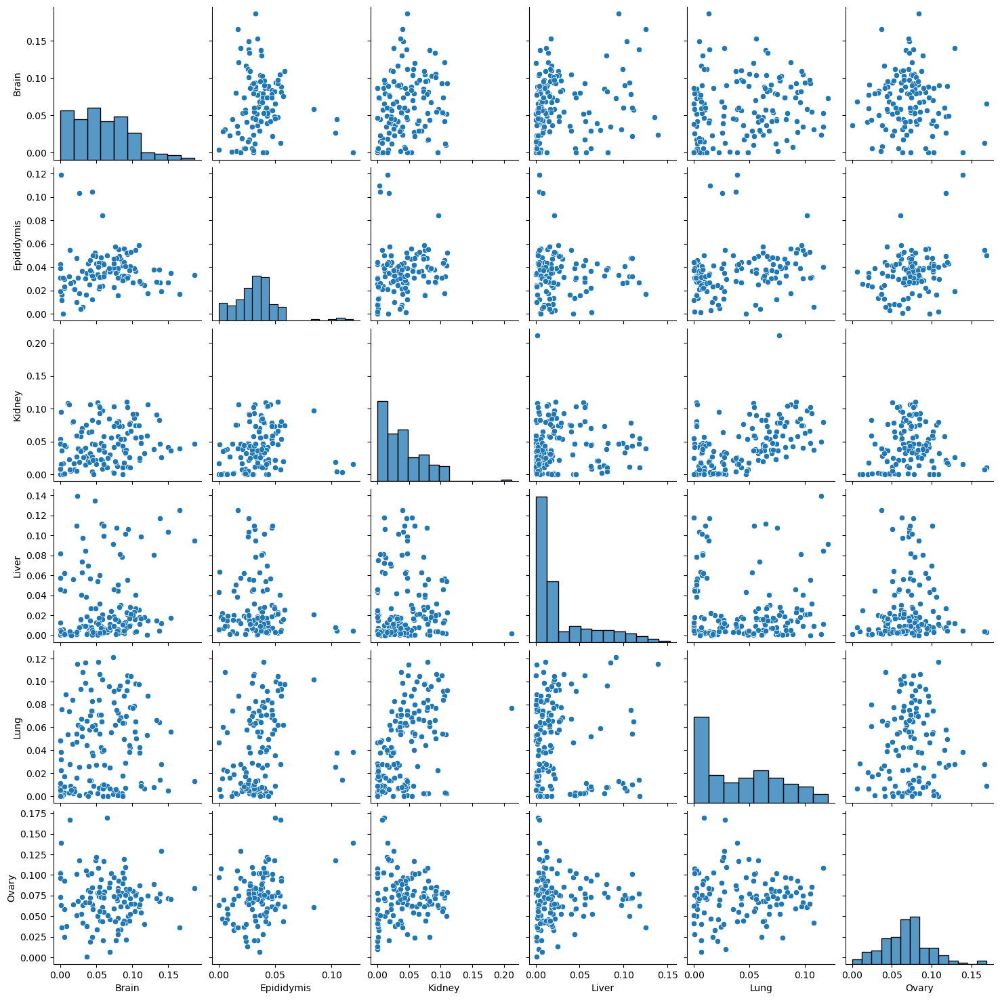

In [148]:
cc_var = cc_df.groupby(['tissue', 'cc']).agg('var', numeric_only=True).reset_index().drop(columns=['net_edge']).pivot(index='cc',columns='tissue',values='coloc')
sns.pairplot(cc_var)

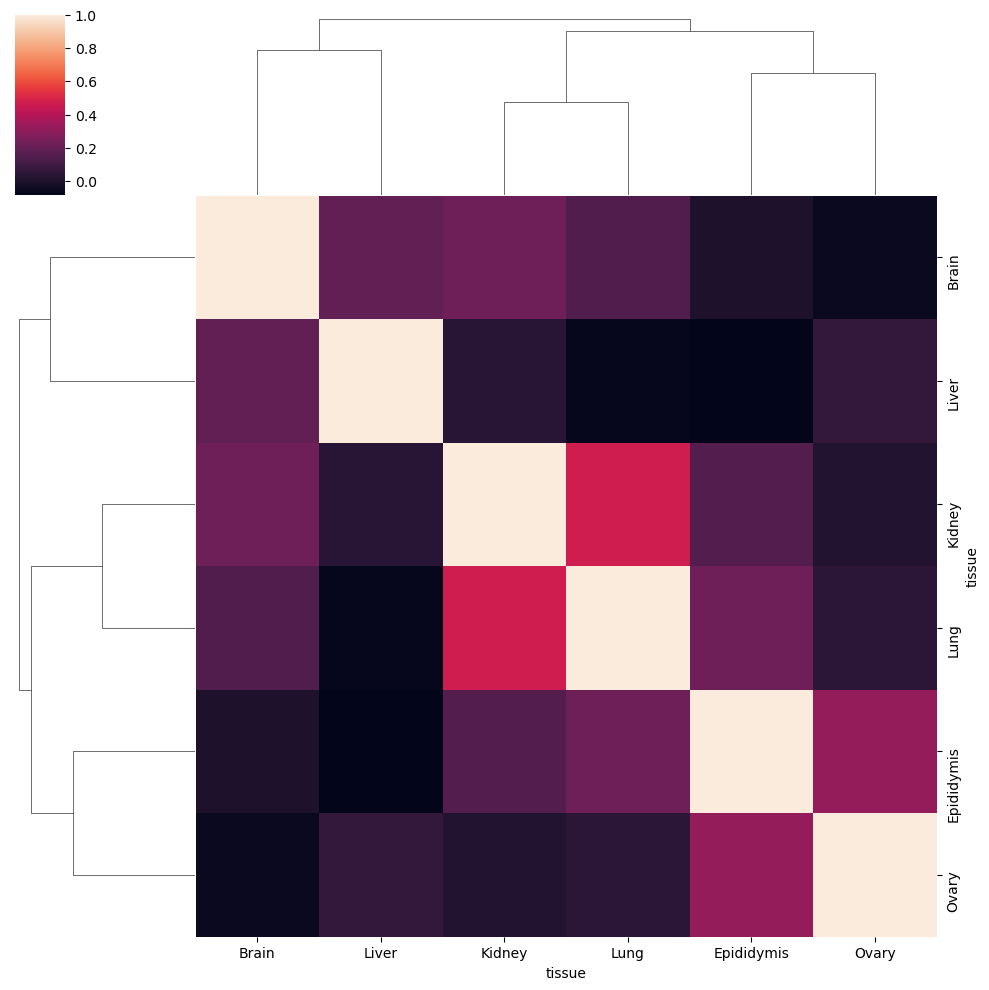

In [149]:
sns.clustermap(cc_var.corr())

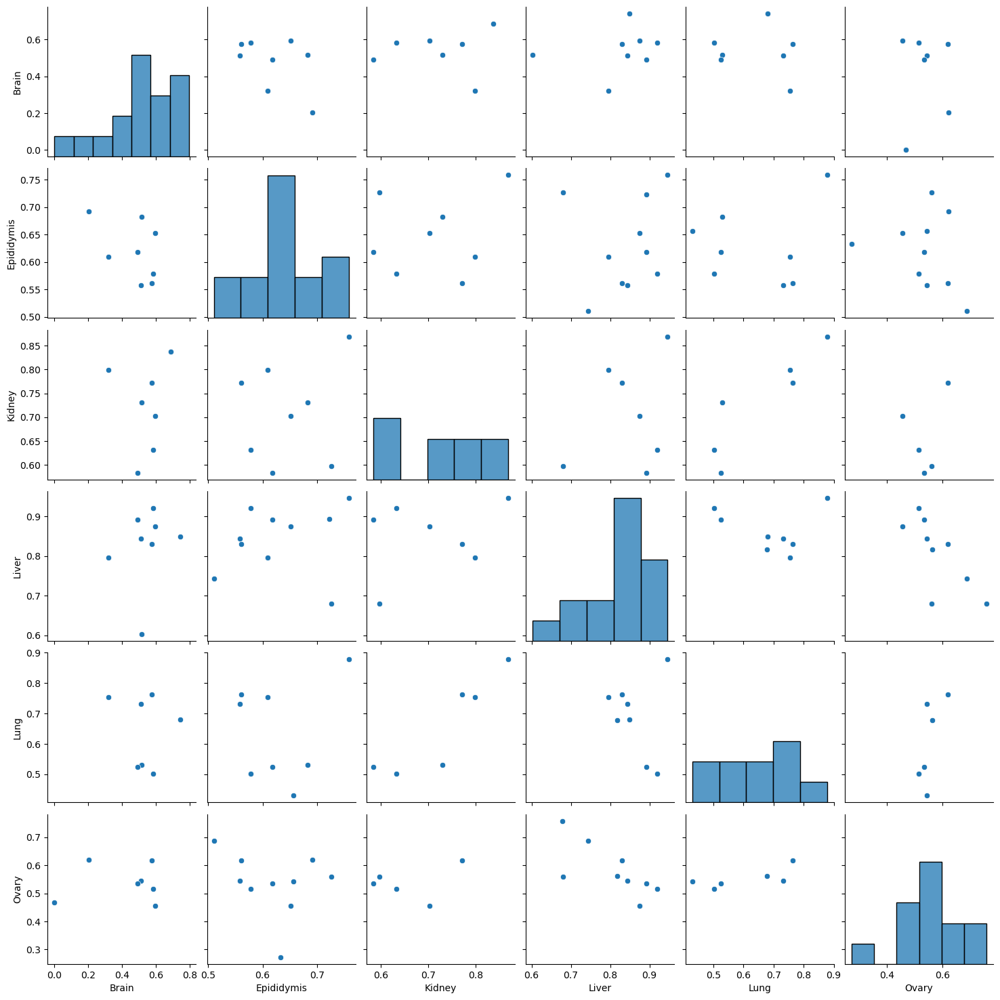

In [154]:
cc_tmp = cc_df.groupby(['tissue', 'cc']).agg('mean', numeric_only=True).reset_index()
cc_tmp = cc_tmp[cc_tmp['net_edge'] > 0.1].drop(columns=['net_edge']).pivot(index='cc',columns='tissue',values='coloc')
sns.pairplot(cc_tmp)

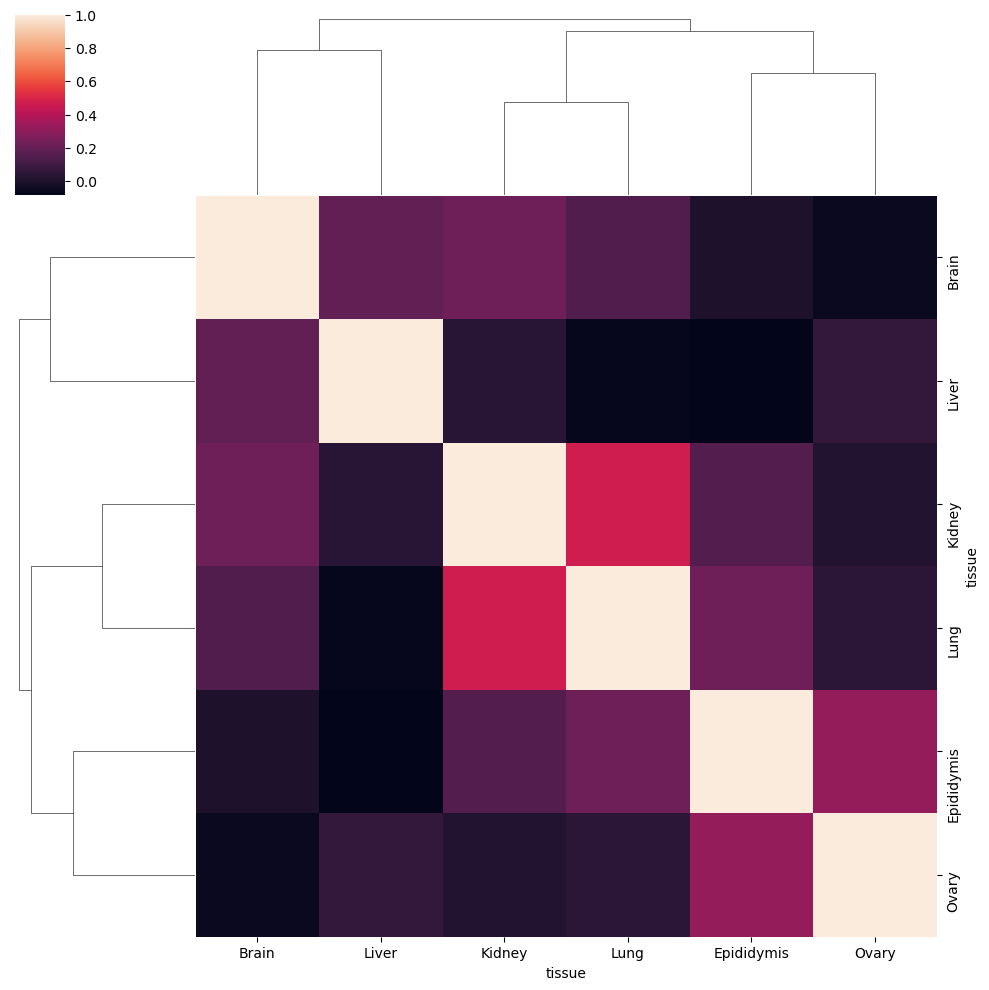

In [155]:
sns.clustermap(cc_var.corr())

In [166]:
np.isnan(cc_tmp['Brain'][10])

True

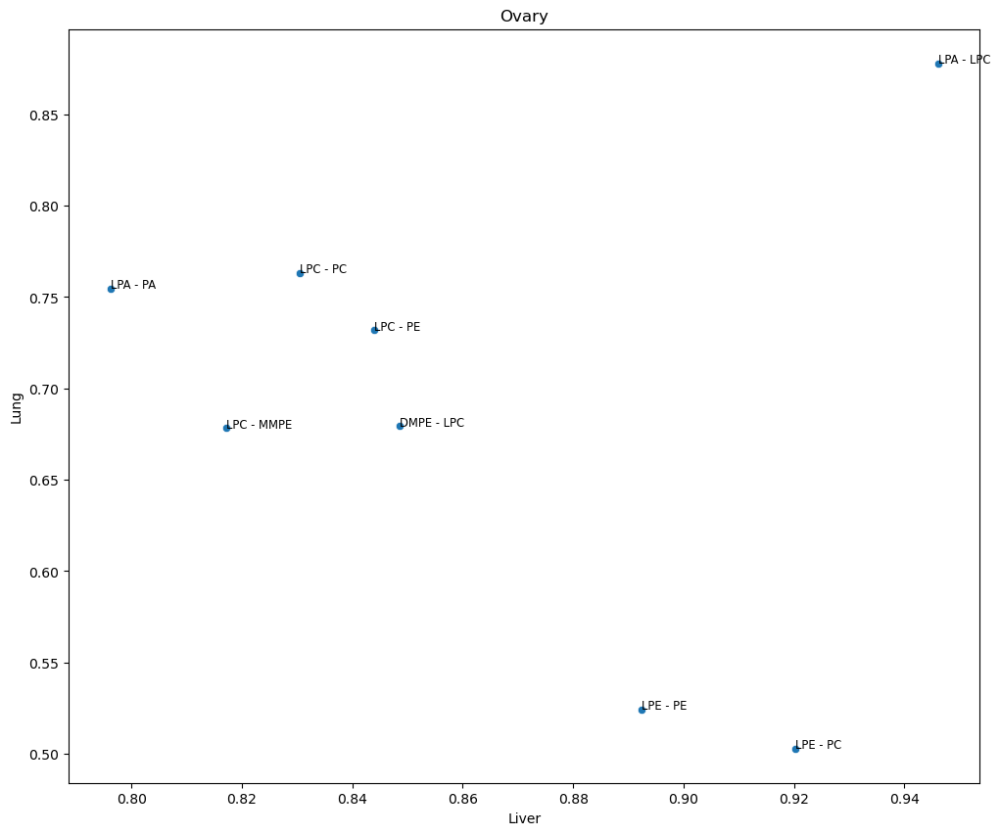

In [172]:
xa = 'Liver'
ya = 'Lung'
ax = sns.scatterplot(data=cc_tmp, x=xa, y=ya)
for line in range(0,cc_tmp.shape[0]):
    if not (np.isnan(cc_tmp[xa][line]) or np.isnan(cc_tmp[ya][line])):
        ax.text(cc_tmp[xa][line], 
                cc_tmp[ya][line], 
                cc_tmp.index[line], 
                horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

### Class-class visualizations

#### TG - Lung/Kidney

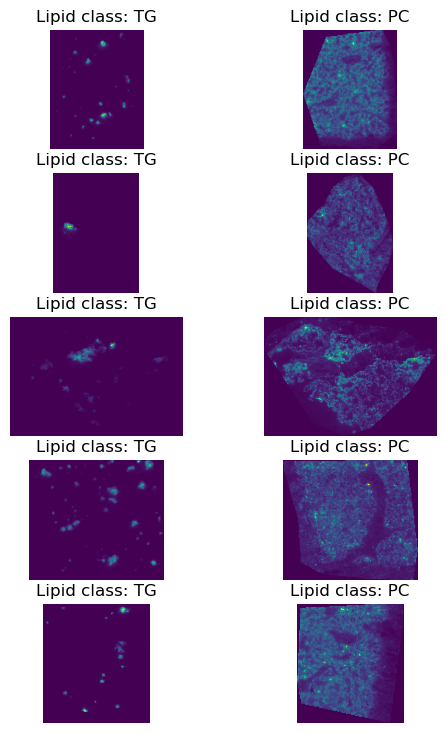

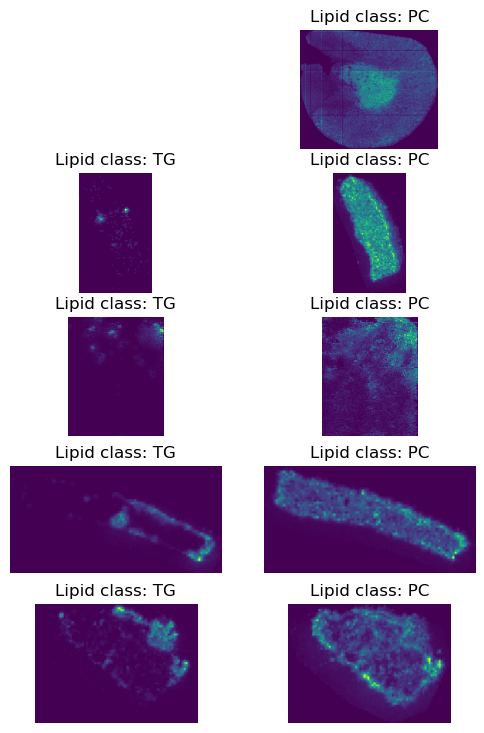

In [135]:
plt.rcParams['figure.figsize'] = (6, 9)

tissue0='Lung'
tissue1='Kidney'

class_list = ['TG', 'PC']

adatas_tissue0 = {key: val for key, val in tissue_ads[tissue0].items() if key in tissue_colocs[tissue0]['coloc_dict'].keys()}

lung_selection = ['2021-08-09_18h51m36s', '2021-05-19_20h09m03s', '2020-11-12_20h48m57s', 
                  '2021-10-11_19h06m59s', '2021-08-16_23h19m04s']
# selection_tissue0 = np.random.choice(list(adatas_tissue0.keys()), 5)
selection_tissue0 = lung_selection
lx_tissue0 = tissue_lx[tissue0]['nets']


adatas_tissue1 = {key: val for key, val in tissue_ads[tissue1].items() if key in tissue_colocs[tissue1]['coloc_dict'].keys()}

kidney_selection = ['2016-12-21_09h49m12s', '2021-03-04_23h31m12s', '2018-07-12_05h47m52s', 
                    '2021-05-05_23h20m26s', '2020-03-12_22h19m39s']
# selection_tissue1 = np.random.choice(list(adatas_tissue1.keys()), 5)
selection_tissue1 = kidney_selection
lx_tissue1 = tissue_lx[tissue1]['nets']

display_lipidclass_ion_images(class_list, 
                              adatas_tissue0, adatas_tissue1, 
                              selection_tissue0, selection_tissue1,
                              lx_tissue0, lx_tissue1
                             )

#### PC/LPC/TG - Brain/Kidney

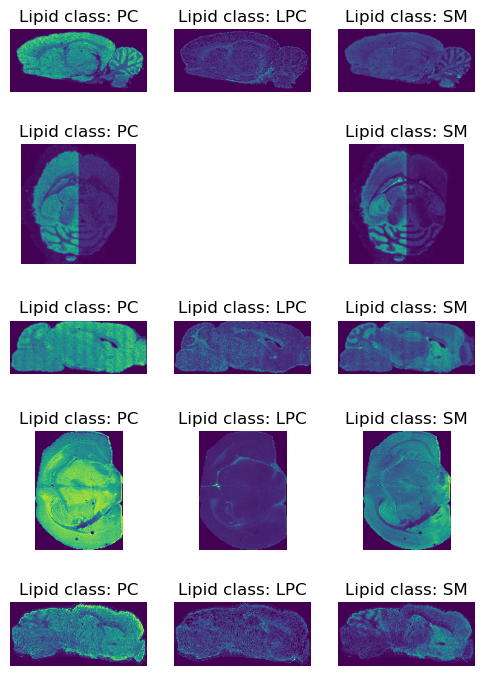

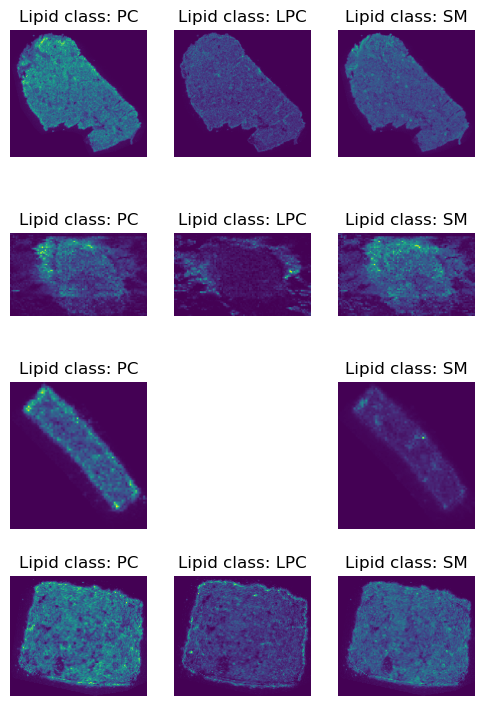

In [171]:
plt.rcParams['figure.figsize'] = (6, 9)

tissue0='Brain'
tissue1='Kidney'

class_list = ['PC', 'LPC', 'SM']

adatas_tissue0 = {key: val for key, val in tissue_ads[tissue0].items() if key in tissue_colocs[tissue0]['coloc_dict'].keys()}

brain_selection = ['2022-07-19_19h29m24s', '2022-05-30_20h44m19s',
                   '2021-11-11_11h49m37s', '2016-09-21_16h06m56s', '2021-11-04_11h38m42s']
# selection_tissue0 = np.random.choice(list(adatas_tissue0.keys()), 5)
selection_tissue0 = brain_selection
lx_tissue0 = tissue_lx[tissue0]['nets']


adatas_tissue1 = {key: val for key, val in tissue_ads[tissue1].items() if key in tissue_colocs[tissue1]['coloc_dict'].keys()}

kidney_selection = ['2020-01-21_22h56m53s', '2018-06-13_17h23m20s', '2021-05-05_23h21m41s', '2020-01-15_21h34m32s']
# selection_tissue1 = np.random.choice(list(adatas_tissue1.keys()), 5)
selection_tissue1 = kidney_selection
lx_tissue1 = tissue_lx[tissue1]['nets']

display_lipidclass_ion_images(class_list, 
                              adatas_tissue0, adatas_tissue1, 
                              selection_tissue0, selection_tissue1,
                              lx_tissue0, lx_tissue1
                             )

## Negative Lipids

In [7]:
tissue_colocs = pickle.load(open(os.path.join(store_dir, 'neg_lip_tissue_colocs.pickle'), "rb" ))
df = pd.concat([x['c_measures'].assign(tissue=tis) for tis, x in tissue_colocs.items()])
df['mean_sig'] = df['pval_mean_corr'] <= 0.05
df['mediqr_sig'] = df['pval_mediqr_corr'] <= 0.05

In [8]:
# Required for visualization of mean ion images
neg_lip_top_datasets = pickle.load(open(os.path.join(store_dir, 'neg_lip_top_datasets_list.pickle'), "rb" ))
tissue_ads = load_alltissue_datasets(neg_lip_top_datasets)

### Combined modules

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


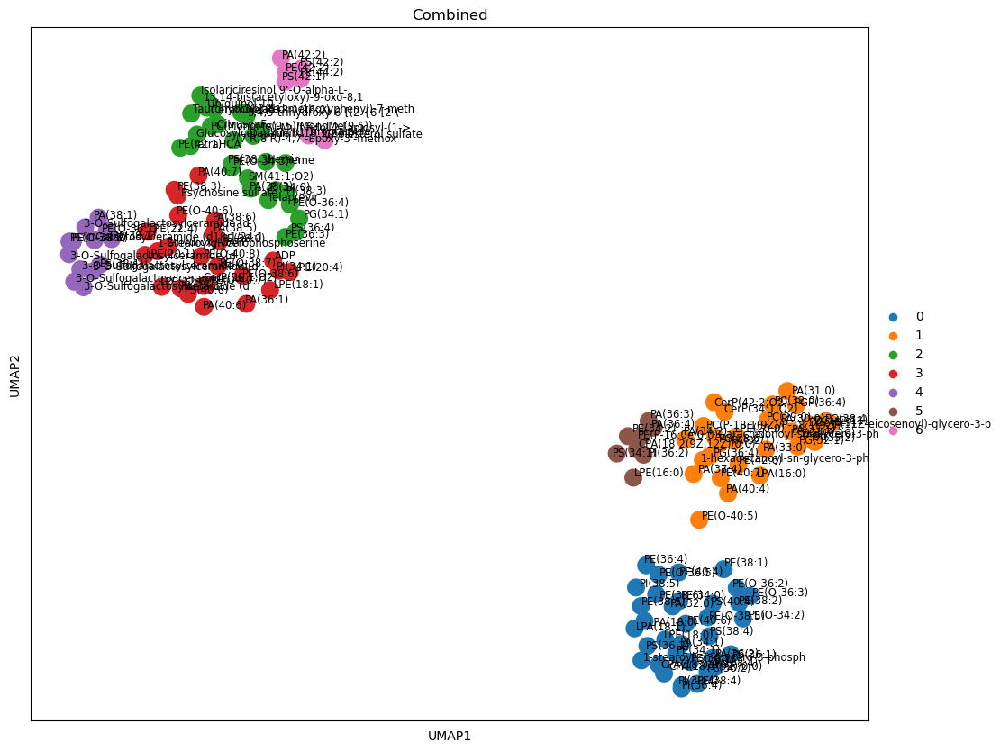

In [65]:
combined_adata = pickle.load(open(os.path.join(module_dir, f'neg_lip_combined_modules.pickle'), "rb" ))

test = load_enrichment('enrichment_result_{}_neg_lip_{}', tissue='combined', ontologies=['LION', 'METABOclass', 'METABOsubclass'])
sig_threshold = 0.1

max_elem = max([tab[tab['q.value_median'] <= sig_threshold] .shape[0] for tab in test.values()])

ax = sc.pl.umap(combined_adata, color='leiden', show=False)
    
for line in range(0,combined_adata.shape[0]):
    ax.text(combined_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            combined_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            combined_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title('Combined')
plt.show()

#### Cluster 0

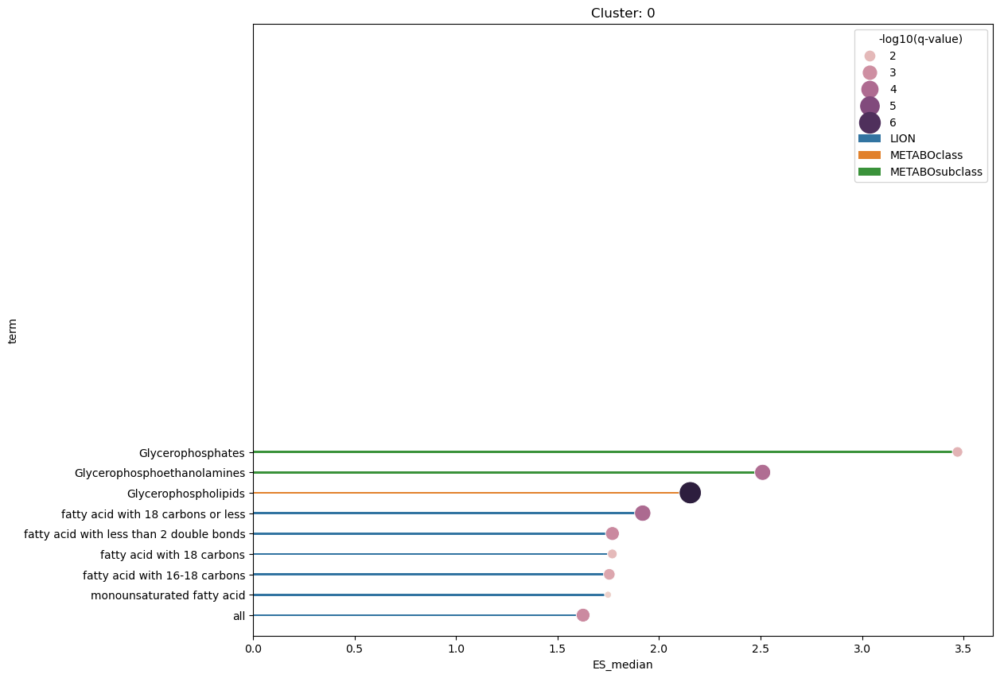

In [68]:
clstr = 0
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Cluster 3

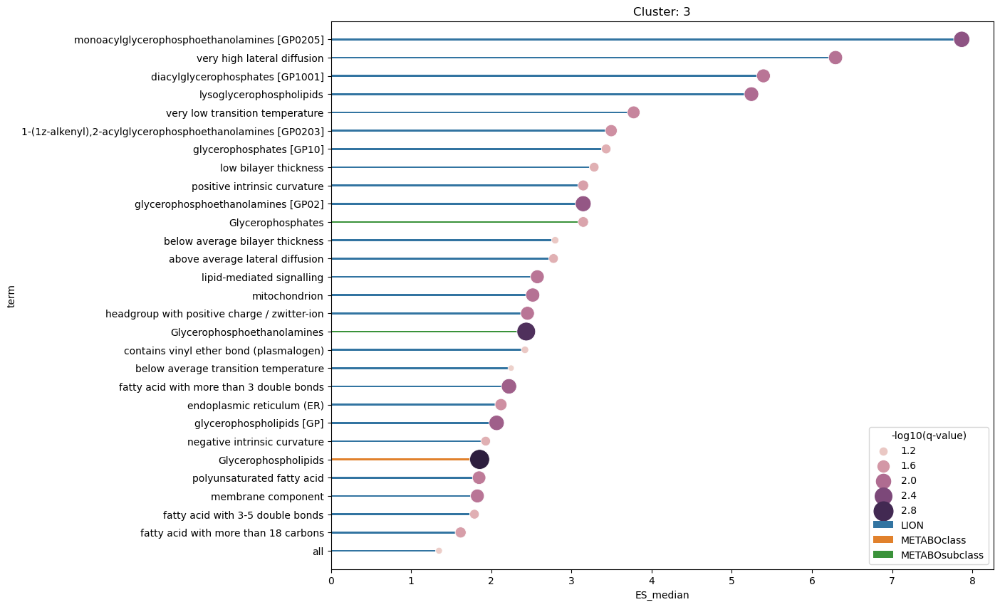

In [58]:
clstr = 3
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Cluster 4

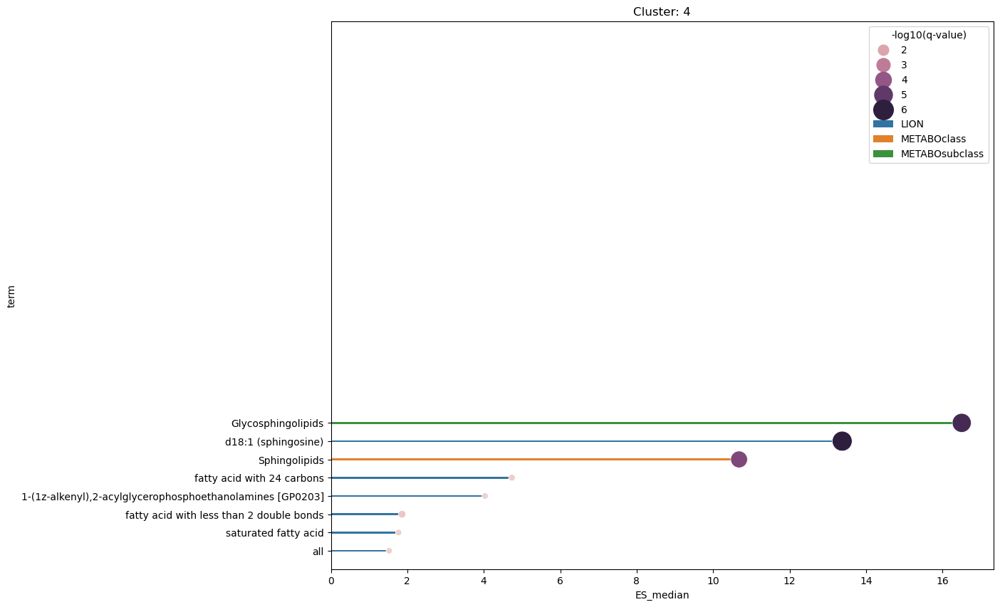

In [64]:
clstr = 4
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

### Tissue modules

#### Brain

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


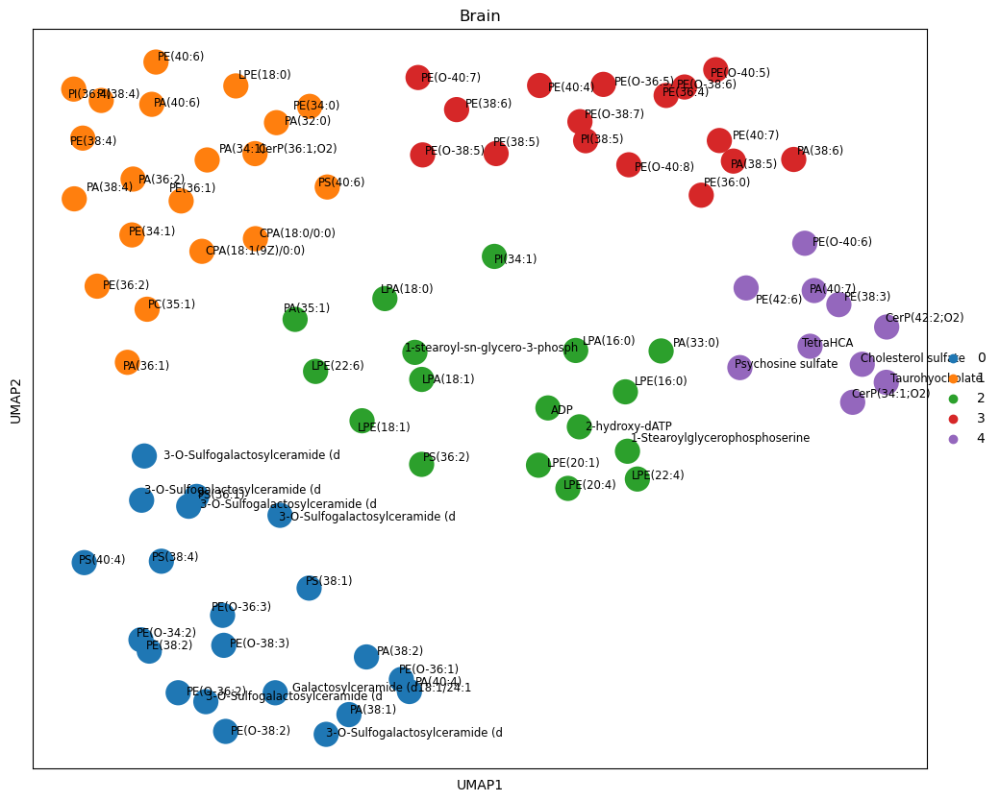

In [94]:
tissue='Brain'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_lip_{tissue}_modules.pickle'), "rb" ))

test = load_enrichment('enrichment_result_{}_neg_lip_{}', tissue=tissue, ontologies=['LION', 'METABOclass', 'METABOsubclass'])
sig_threshold = 0.1
max_elem = max([tab[tab['q.value_median'] <= sig_threshold] .shape[0] for tab in test.values()])
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

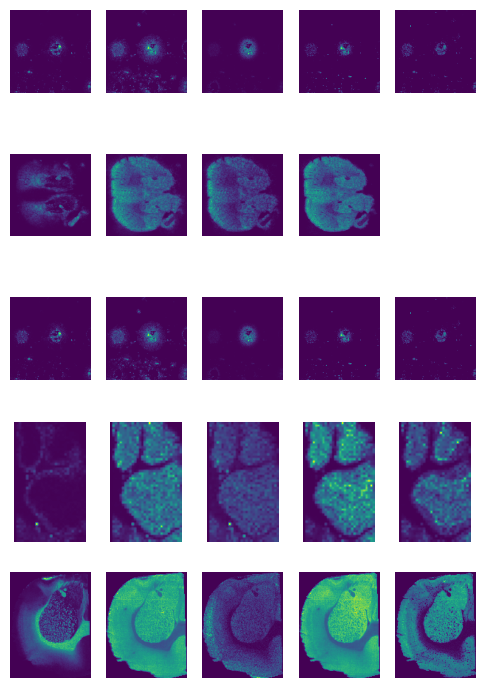

In [179]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

##### Cluster 0

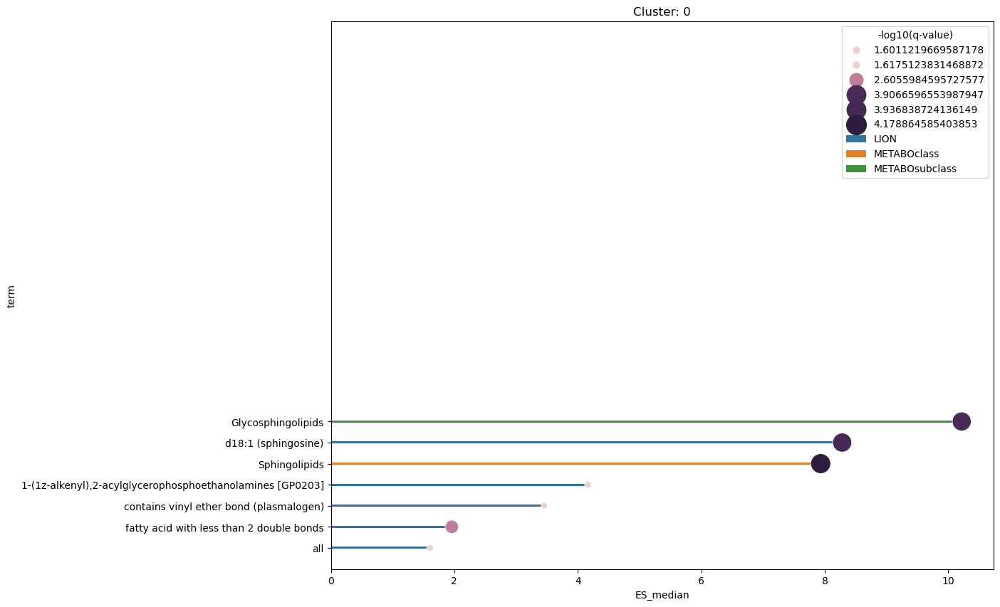

In [95]:
clstr = 0
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

##### CLuster 1

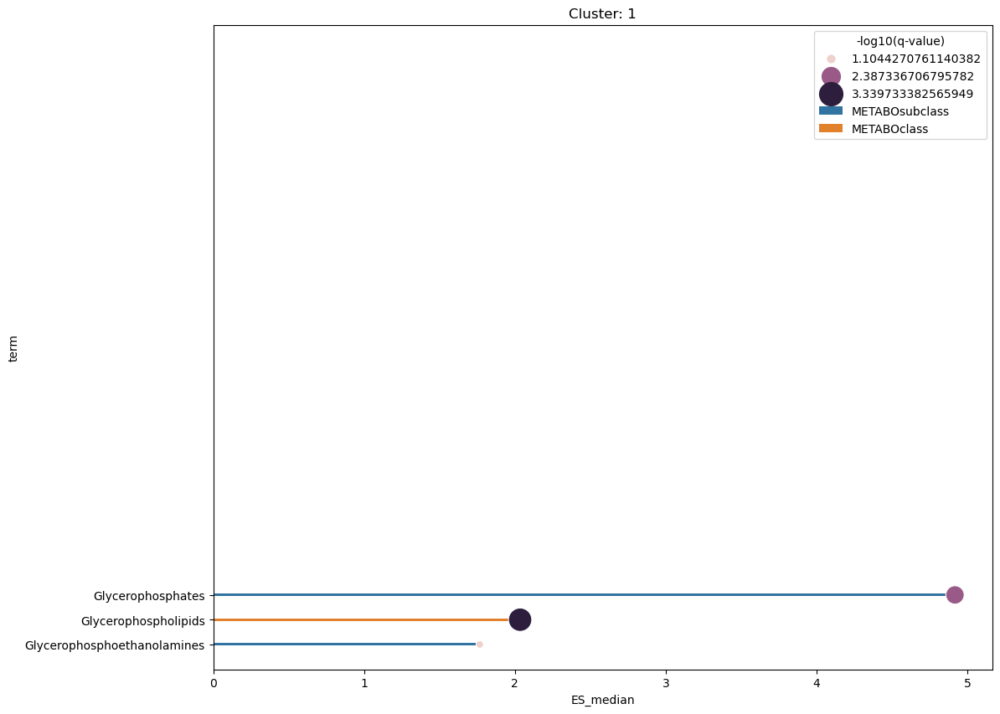

In [96]:
clstr = 1
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

##### Cluster 2

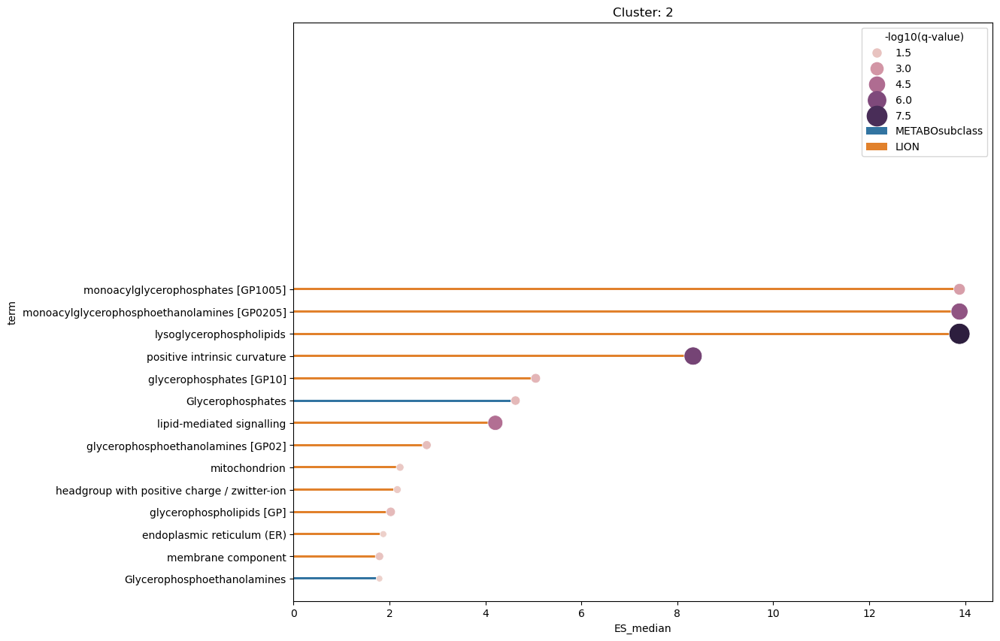

In [97]:
clstr = 2
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

##### Cluster 3

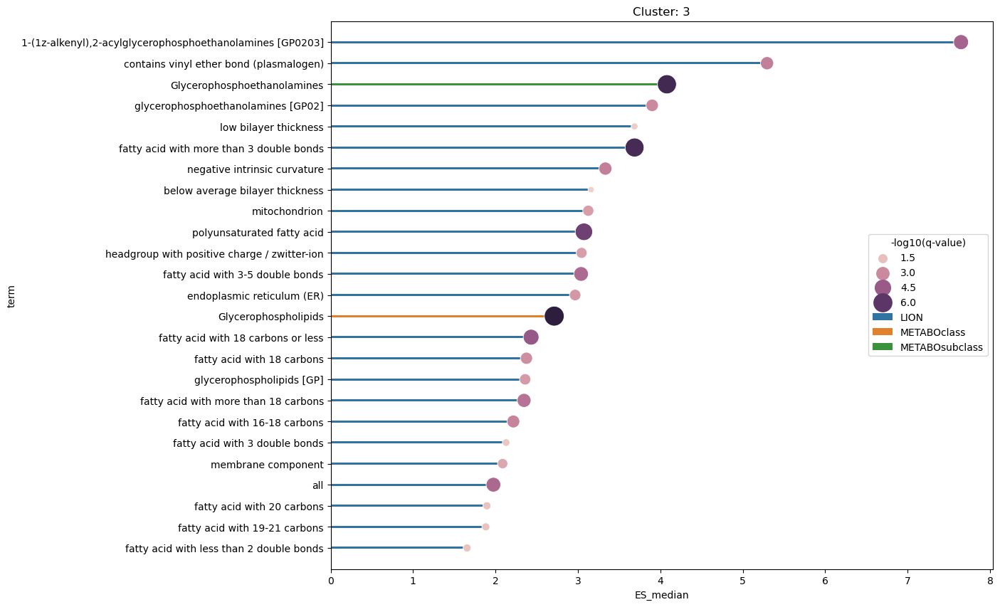

In [98]:
clstr = 3
plot_enrichment(test[clstr][test[clstr]['q.value_median'] <= sig_threshold], clstr, max_elem)

#### Other

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


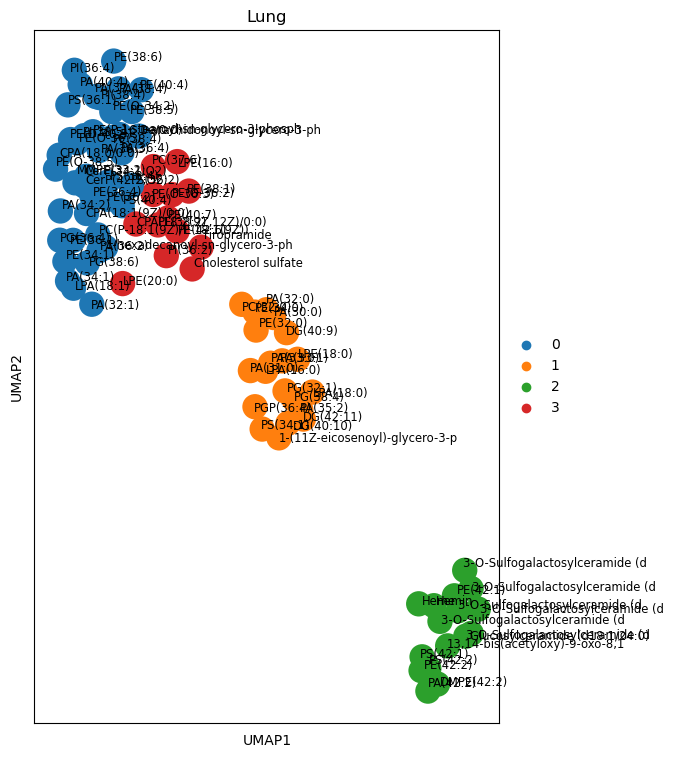

In [180]:
tissue='Lung'
enr_file = f'enrichment_result_neg_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

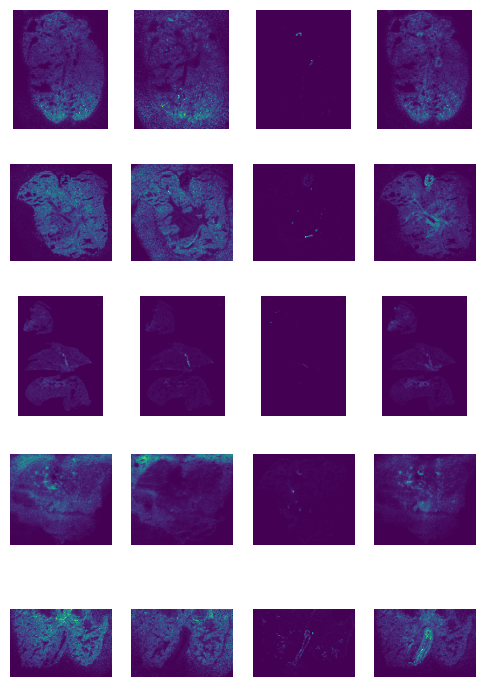

In [183]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


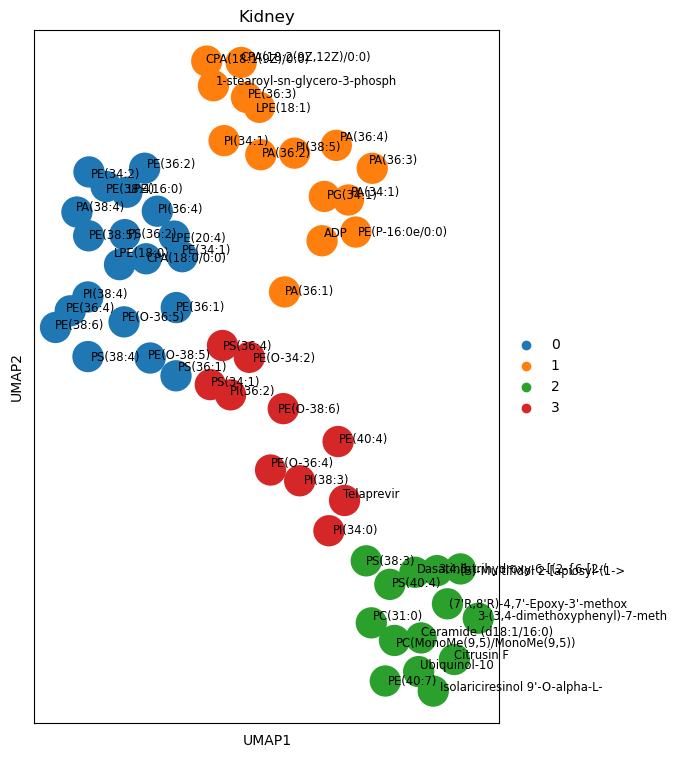

In [184]:
tissue='Kidney'
enr_file = f'enrichment_result_neg_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

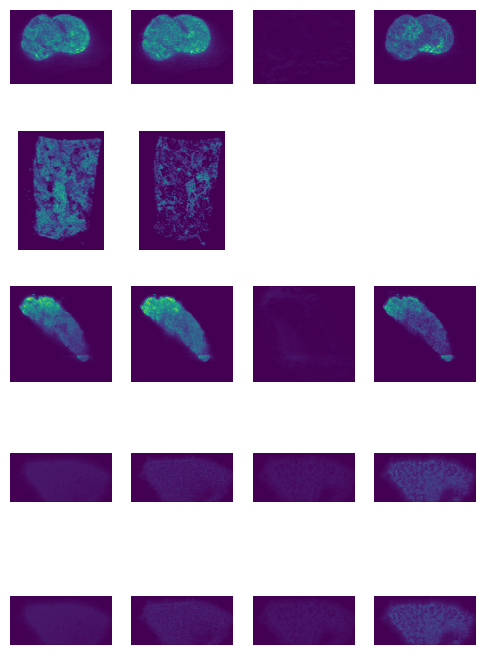

In [187]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


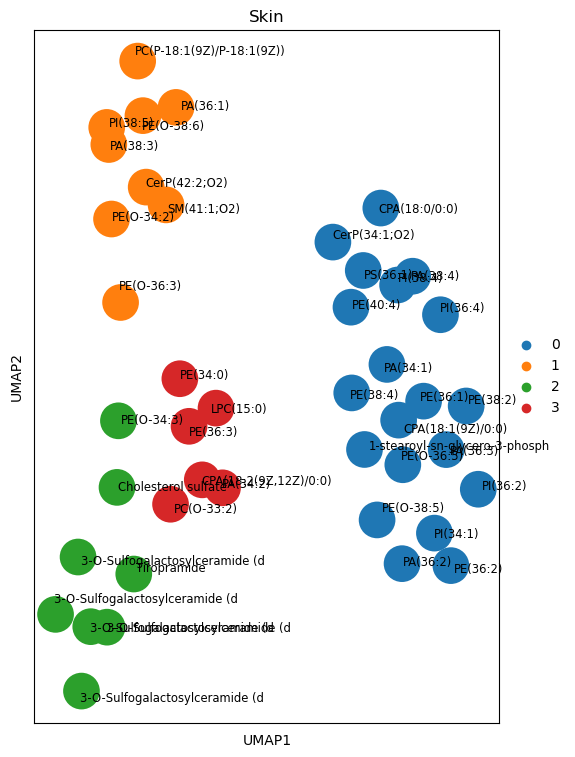

In [188]:
tissue='Skin'
enr_file = f'enrichment_result_neg_lip_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_lip_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

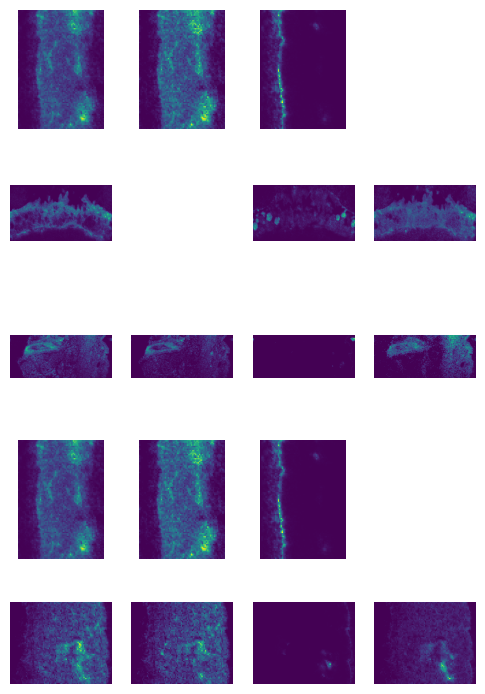

In [190]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

### Pairplots

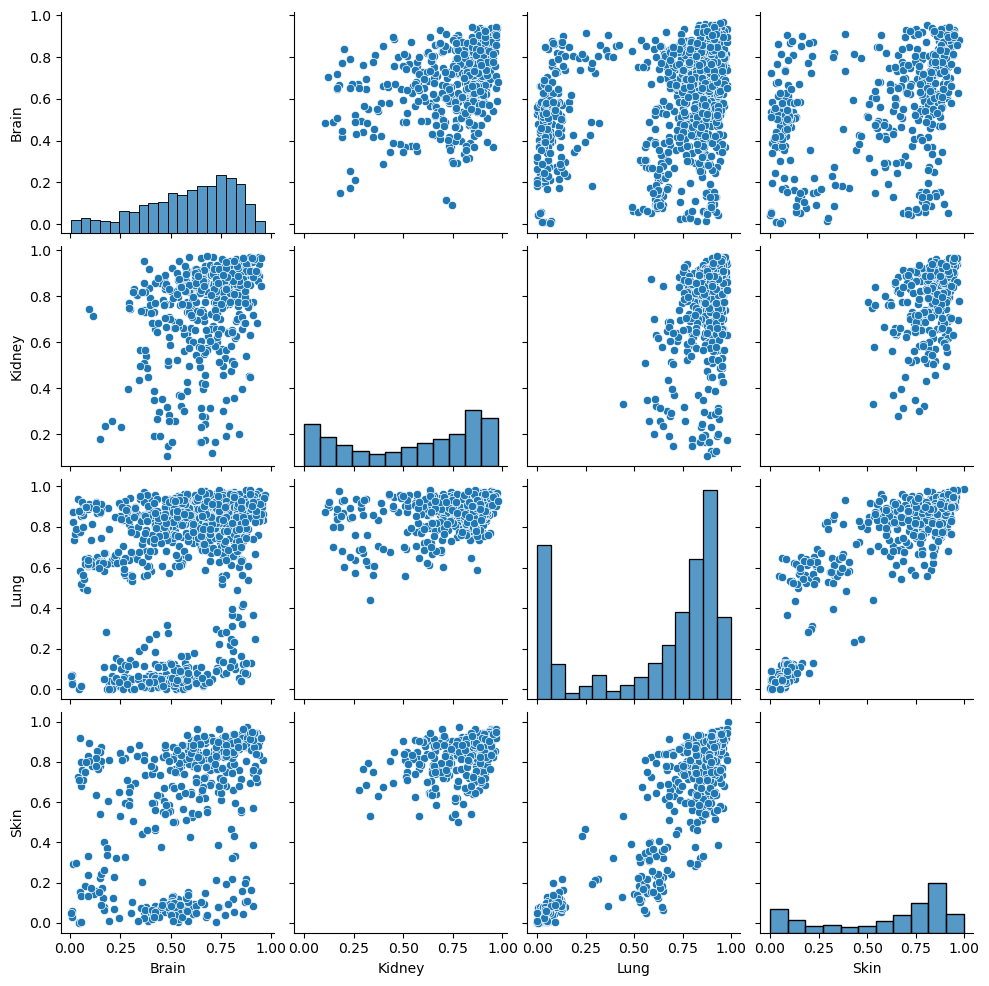

In [191]:
out_dict = {}
for tis in tissue_colocs.keys():
    tmp = df[df['tissue']==tis]['mean']
    curr_series = pd.Series(np.nan, index=list(set(df.index)))
    for key, val in tmp.items():
        curr_series[key]=val
    out_dict[tis] = curr_series
pairdf = pd.DataFrame(out_dict)
    
sns.pairplot(pairdf)

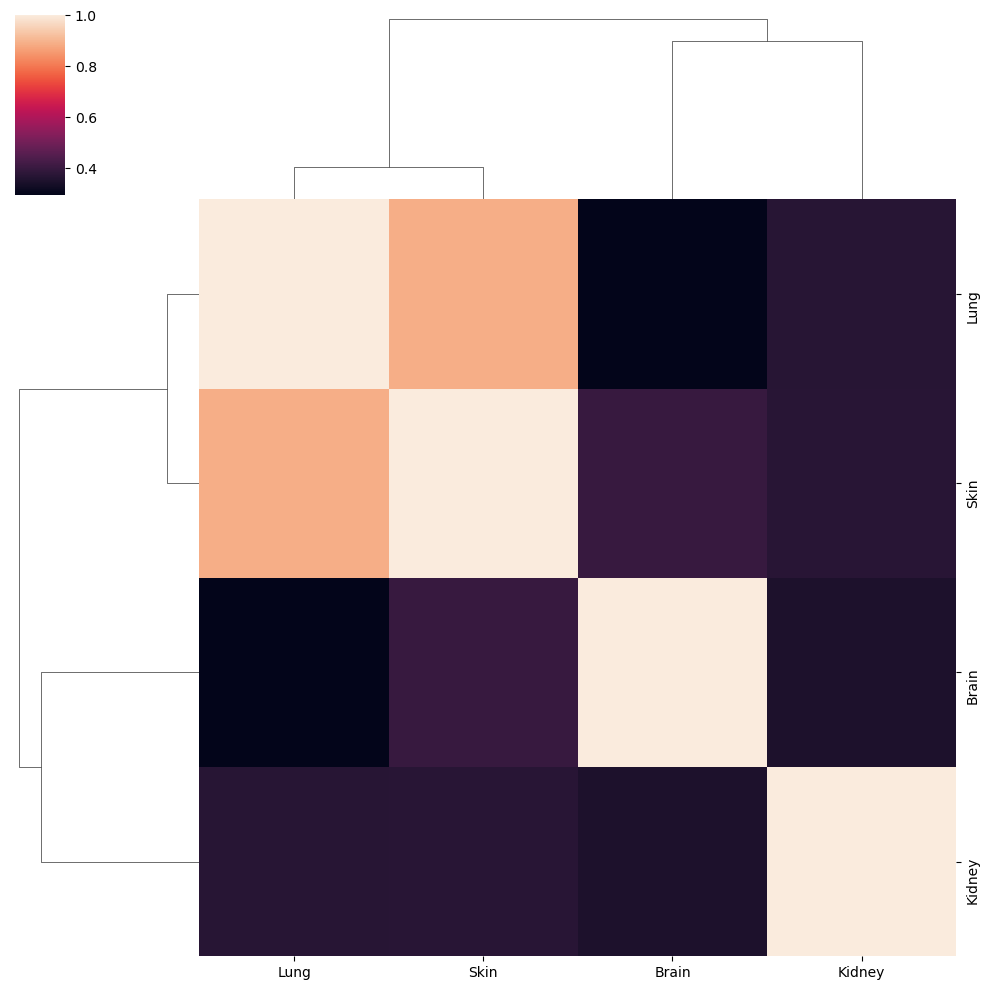

In [192]:
sns.clustermap(pairdf.corr())

## Positive metabolites

In [193]:
tissue_colocs = pickle.load(open(os.path.join(store_dir, 'pos_met_tissue_colocs.pickle'), "rb" ))
df = pd.concat([x['c_measures'].assign(tissue=tis) for tis, x in tissue_colocs.items()])
df['mean_sig'] = df['pval_mean_corr'] <= 0.05
df['mediqr_sig'] = df['pval_mediqr_corr'] <= 0.05

In [194]:
# Required for visualization of mean ion images
pos_met_top_datasets = pickle.load(open(os.path.join(store_dir, 'pos_met_top_datasets_list.pickle'), "rb" ))
tissue_ads = load_alltissue_datasets(pos_met_top_datasets)

### Tissue modules

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


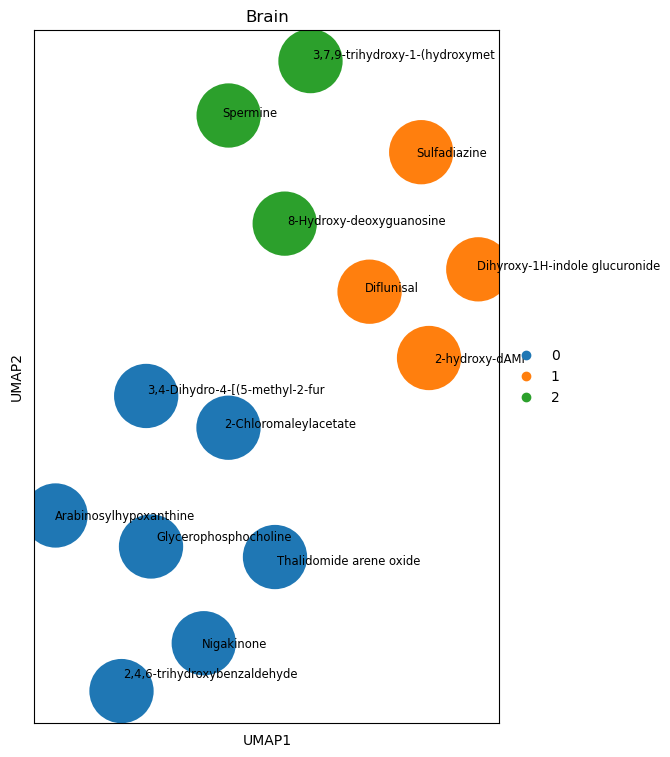

In [195]:
tissue='Brain'
enr_file = f'enrichment_result_pos_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

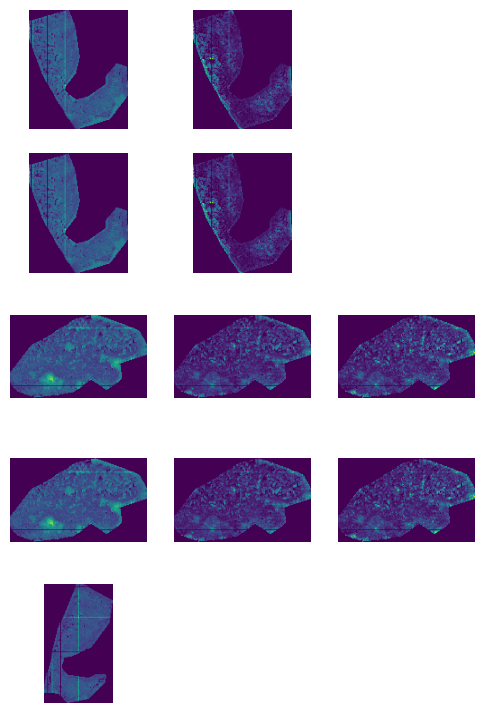

In [202]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


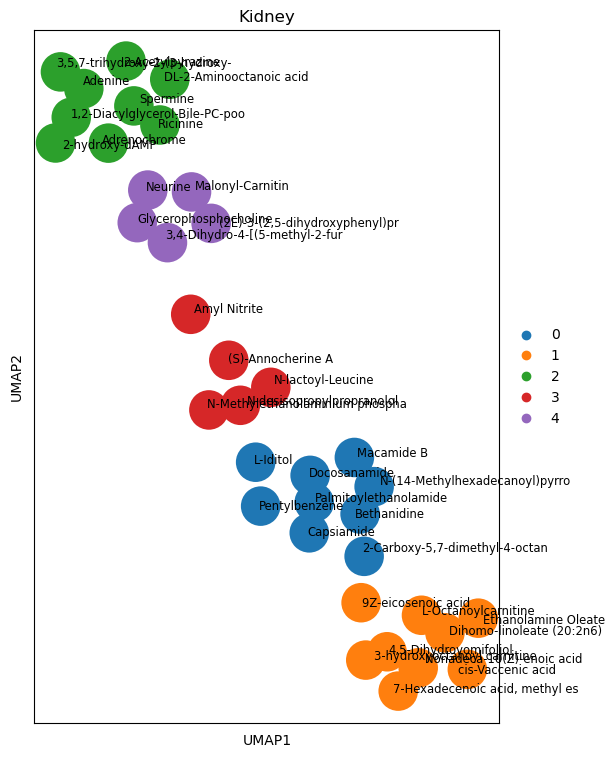

In [203]:
tissue='Kidney'
enr_file = f'enrichment_result_pos_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

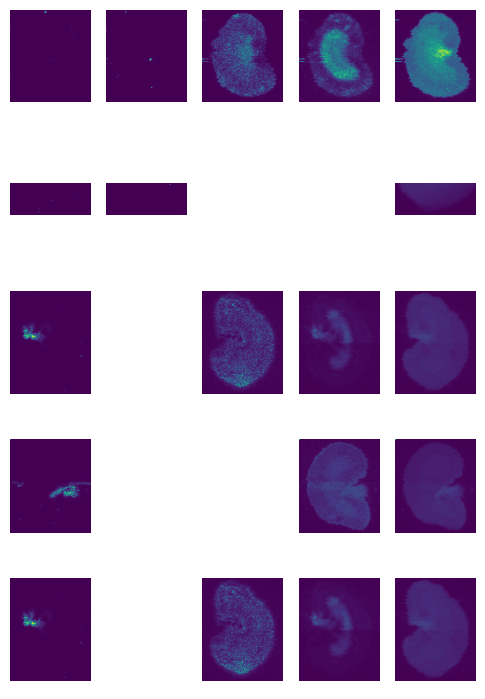

In [205]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


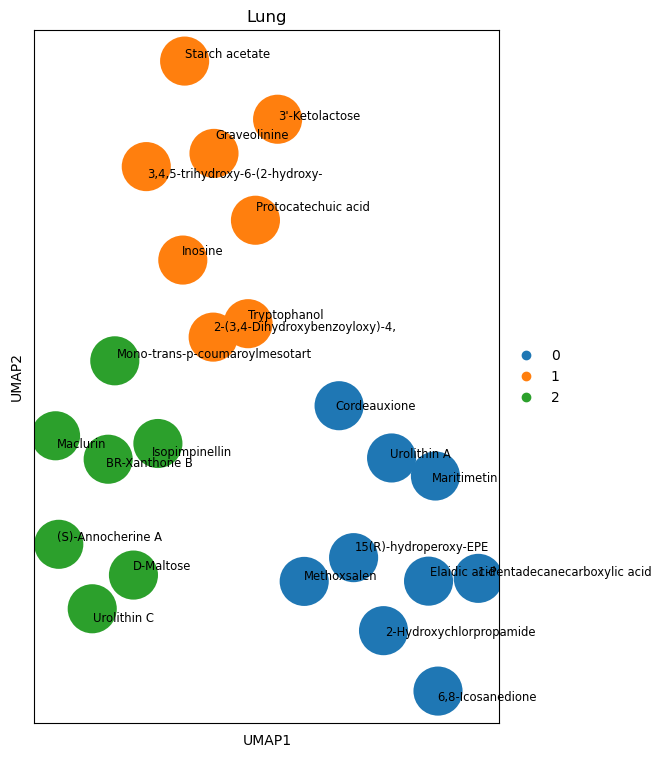

In [206]:
tissue='Lung'
enr_file = f'enrichment_result_pos_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

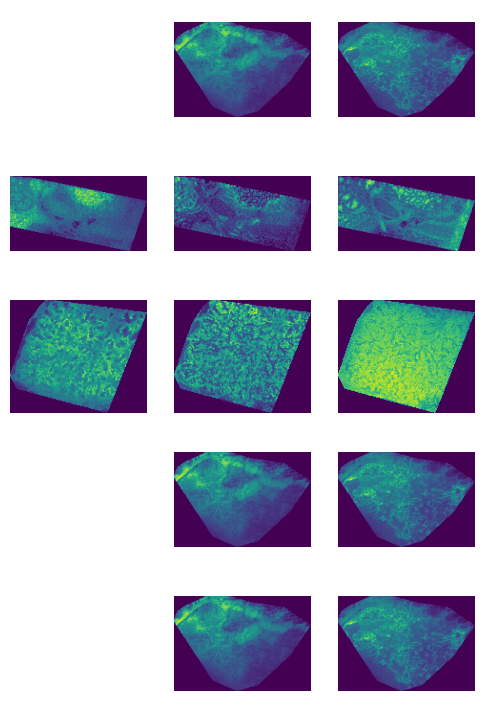

In [208]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


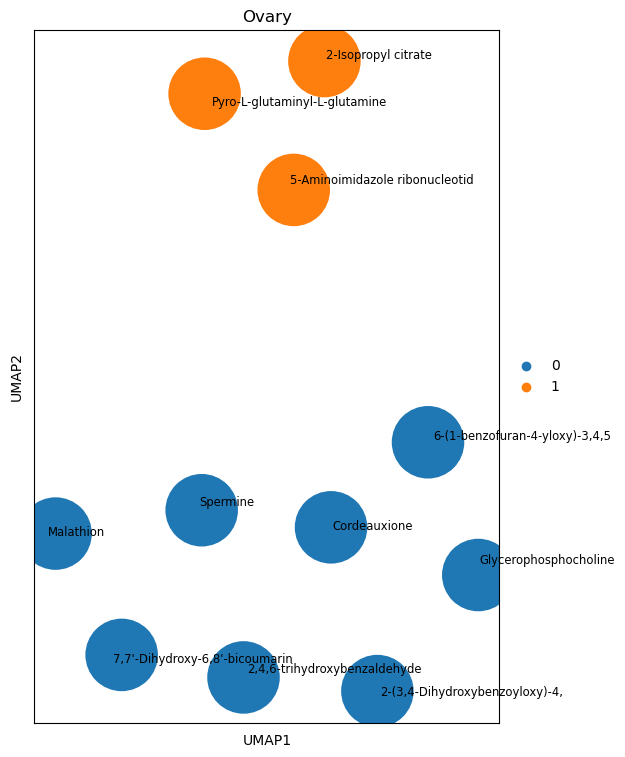

In [209]:
tissue='Ovary'
enr_file = f'enrichment_result_pos_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'pos_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

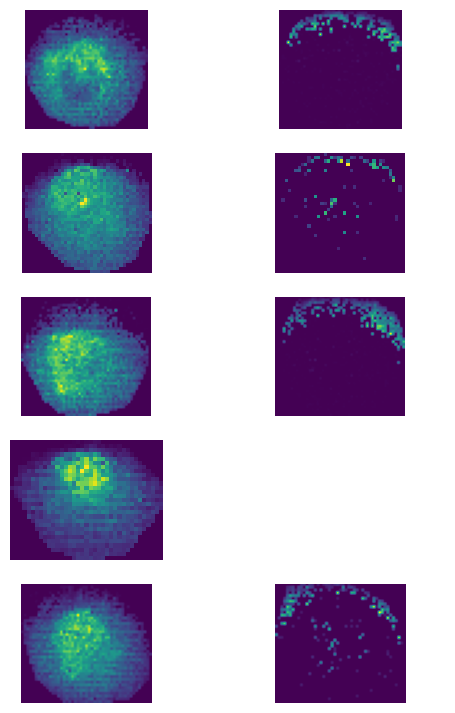

In [210]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

### Pairplots

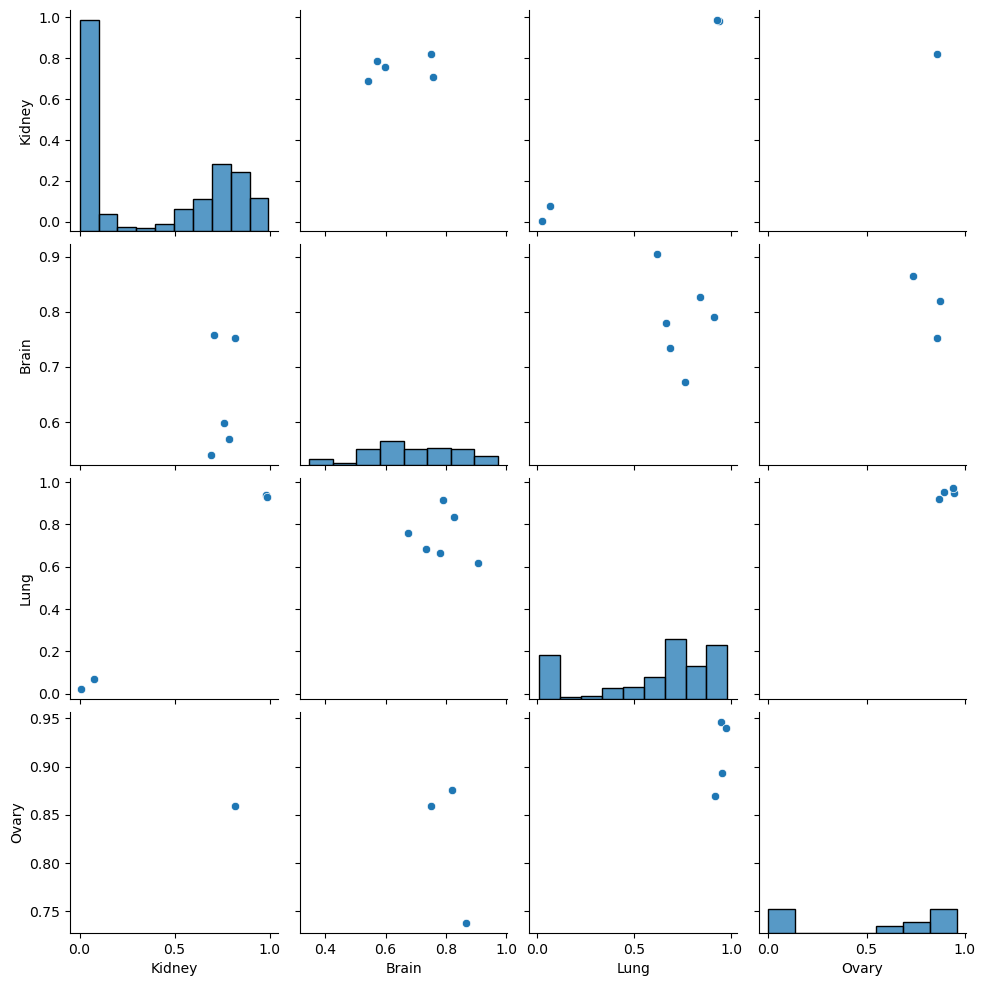

In [211]:
out_dict = {}
for tis in tissue_colocs.keys():
    tmp = df[df['tissue']==tis]['mean']
    curr_series = pd.Series(np.nan, index=list(set(df.index)))
    for key, val in tmp.items():
        curr_series[key]=val
    out_dict[tis] = curr_series
pairdf = pd.DataFrame(out_dict)
    
sns.pairplot(pairdf)

## Negative metabolites

In [213]:
tissue_colocs = pickle.load(open(os.path.join(store_dir, 'neg_met_tissue_colocs.pickle'), "rb" ))
df = pd.concat([x['c_measures'].assign(tissue=tis) for tis, x in tissue_colocs.items()])
df['mean_sig'] = df['pval_mean_corr'] <= 0.05
df['mediqr_sig'] = df['pval_mediqr_corr'] <= 0.05

In [214]:
# Required for visualization of mean ion images
neg_met_top_datasets = pickle.load(open(os.path.join(store_dir, 'neg_met_top_datasets_list.pickle'), "rb" ))
tissue_ads = load_alltissue_datasets(neg_met_top_datasets)

### Tissue modules

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


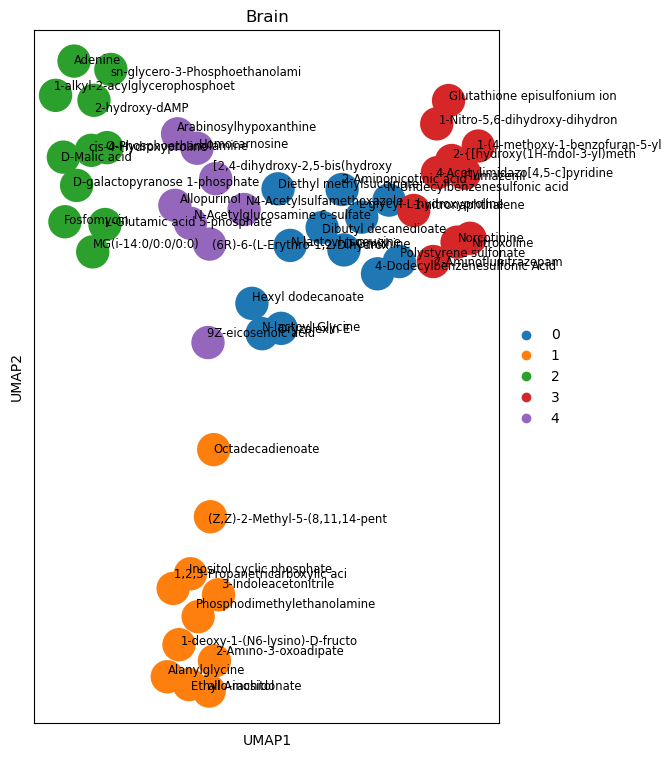

In [217]:
tissue='Brain'
enr_file = f'enrichment_result_neg_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

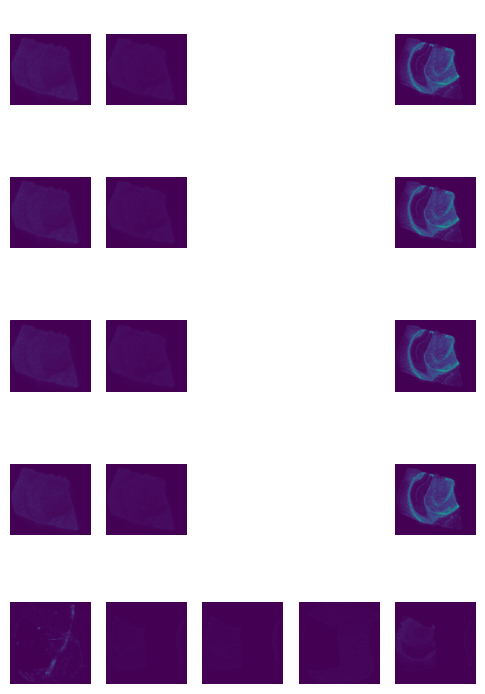

In [226]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


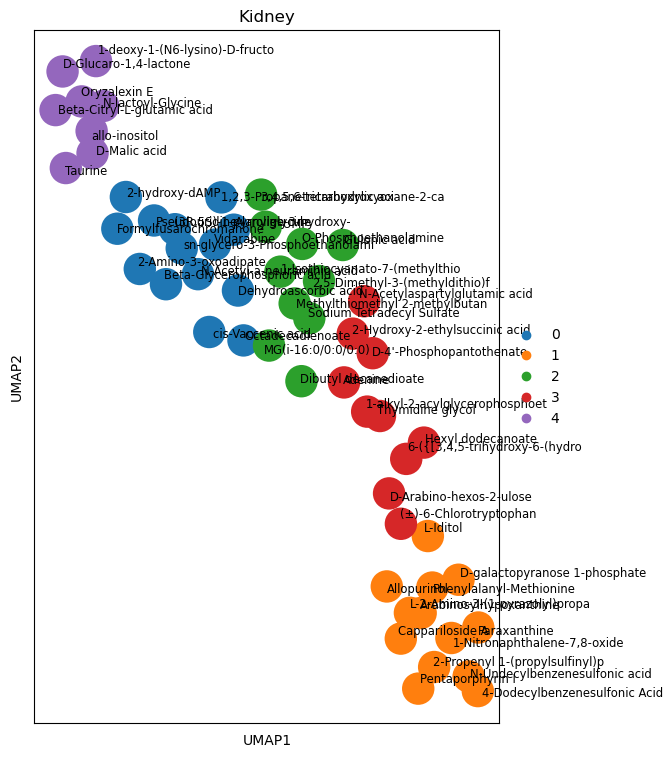

In [227]:
tissue='Kidney'
enr_file = f'enrichment_result_neg_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

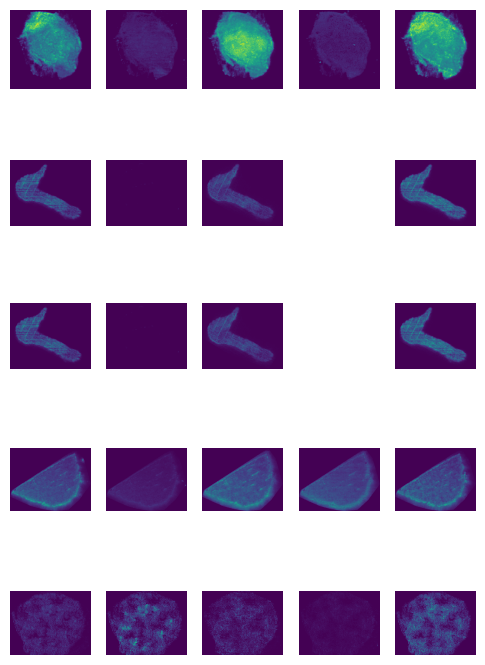

In [230]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


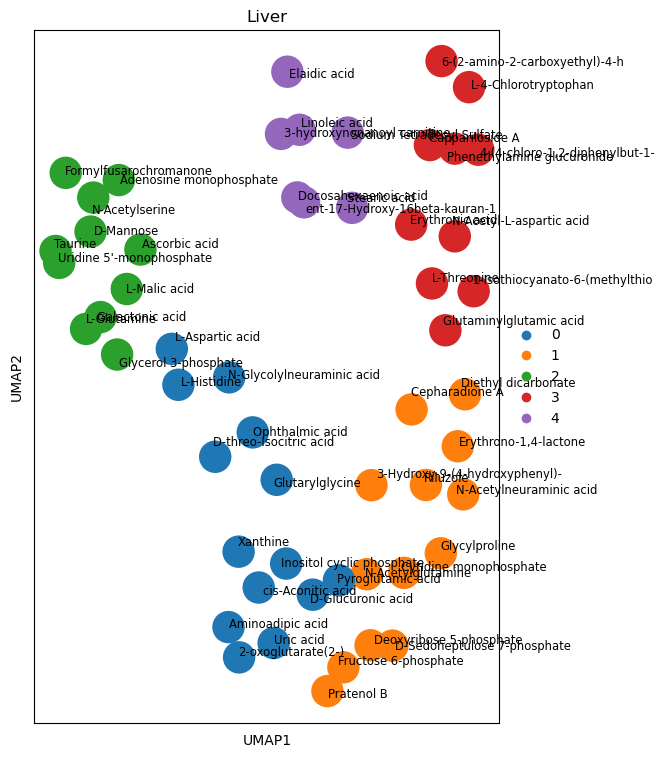

In [231]:
tissue='Liver'
enr_file = f'enrichment_result_neg_met_{tissue}'
tissue_adata = pickle.load(open(os.path.join(module_dir, f'neg_met_{tissue}_modules.pickle'), "rb" ))
tissue_enrichment = {}

# for file in [x for x in os.listdir(enrichment_dir) if x.startswith(enr_file)]:
#     # My mistake with wrong delimiter..set_index('term').join(lion_terms.set_index('ID'), how='left') Will be fixed in next execution of enrichment analysis
#     tissue_enrichment[file.split(enr_file)[1].split('.')[0]] = pd.read_csv(os.path.join(enrichment_dir, 
#                                                                                         file), sep=';', decimal=',').set_index('term').join(lion_terms.set_index('ID'), how='left')
    
ax = sc.pl.umap(tissue_adata, color='leiden', show=False)
    
for line in range(0,tissue_adata.shape[0]):
    ax.text(tissue_adata.obsm['X_umap'][line, 0]+np.random.normal(0, 0.05), 
            tissue_adata.obsm['X_umap'][line, 1]+np.random.normal(0, 0.05), 
            tissue_adata.var['molecule'].values[line], 
            horizontalalignment='left', size='small', color='black')
ax.set_title(tissue)
plt.show()

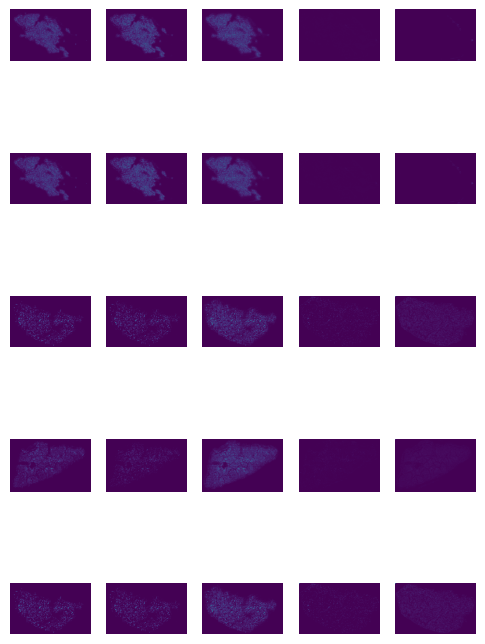

In [236]:
selection = np.random.choice(list(tissue_ads[tissue].keys()), 5)
cluster_assignment = tissue_adata.obs.set_index('formula')['leiden']

display_cluster_ion_images(cluster_assignment, tissue_ads[tissue], adata_selection=selection)

### Pairplots

Not worth doing for such shitty data